# Detección automatizada de basurales con redes neuronales




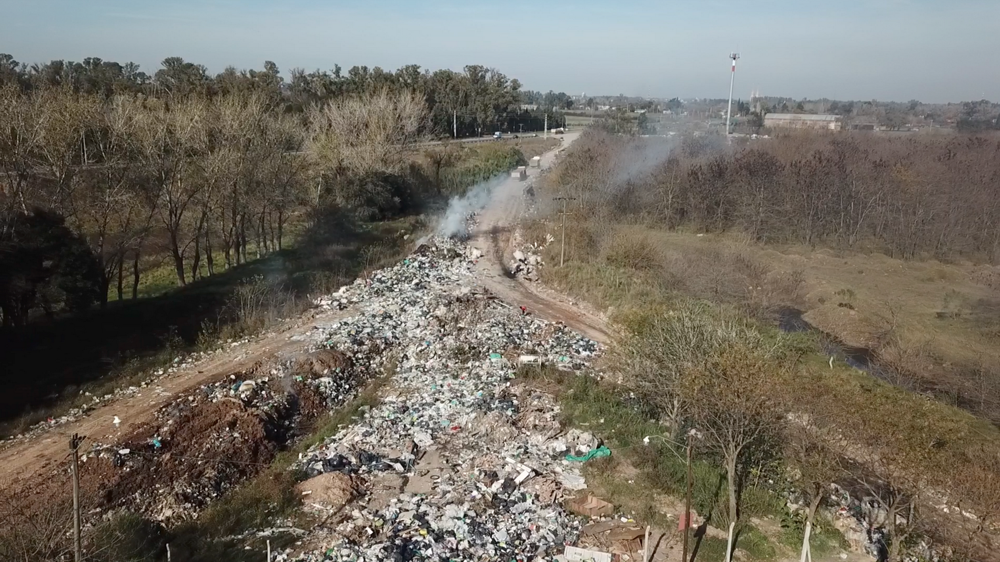

*(fotografía cortesía de https://www.argentina.gob.ar/ambiente/accion/basurales)*

## Los basurales como problema de política pública

El manejo de los basurales a cielo abierto es un enorme desafío de gestión para gobiernos nacionales y municipales. Por su naturaleza no planificada, se emplazan y crecen sin monitoreo, generando una severa degradación ambiental.

El problema de la gestión de la basura urbana excede el campo técnico: existen probadas tecnologías y métodos para recolectar, reciclar y disponer de la basura, pero para aplicarlas se necesita apoyo de gestión, políticas, información, y actitudes.

Desde 2019 la [Fundación Bunge y Born](https://www.fundacionbyb.org/) trabaja en el desarrollo de métodos que permiten identificar y monitorear a bajo costo, y con alta frecuencia, el crecimiento de basurales a cielo abierto. Este esfuerzo, parte de sus [iniciativas de sustenatbilidad](https://www.fundacionbyb.org/sustentabilidad), tiene el propósito es visibilizar la problemática y ofrecer a los gobiernos locales insumos para diseñar e implementar intervenciones tempranas.


## Inteligencia artificial para monitorear basurales

En los ultimos años se ha vuelto cada vez más accesible la adquisición de imágenes aéreas y satelitales de alta resolución, de cualquier región del mundo. En el mismo período a madurado a gran velocidad la capacidad de tecnologías de inteligencia artificial, y en particular las redes neuronales, para realizar reconocimiento de objetos de interés en imágenes. La conjunción de estas dos tendencias llevó a la Fundación Bunge y Born a proponerse la creación de un algoritmo, fácil de implementar, que detecte y mapee basurales en bases a imágenes.  

Para resolver los considerables desafíos tecnológicos y metodológicos involucrados, la Fundación convocó a [Dymaxion Labs](https://dymaxionlabs.com/), startup argentina especializada en inteligencia artificial para el análisis de imágenes satelitales. El proyecto culminó con éxito al generar un algoritmo, entrenado con imágenes satelitales, que demostró su eficacia en la [detección de grandes basurales a cielo abierto en la Provincia de Buenos Aires](https://www.fundacionbyb.org/_files/ugd/2aae47_03757f467e384554b8d88ffd26c60af3.pdf).

Construyendo sobre este primer modelo, diseñado para el monitoreo de mega basurales visibles desde el espacio, el equipo de la Fundación trabajó en colaboración con gobiernos municipales para entrenar una versión capaz de detectar micro-basurales, que aplicaremos a continuación.



## Software requerido

Para aplicar el algoritmo de detección de microbasurales utilizaremos funciones especializadas que reducen en gran medida la complejidad de las tareas a llevar a cabo. En particular, las que proveen las librerías open-source [satproc](https://github.com/dymaxionlabs/satproc), que facilita el procesamiento de imágenes de alta resolución para su uso en _machine learning_, y [unetseg](https://github.com/dymaxionlabs/unetseg), que simplifica el trabajo con redes neuronales para clasificación de imágenes.  


Para instalar las librerías de Python que vamos a usar:

In [ ]:
!pip install pysatproc
!pip install fiona
!pip install unetseg
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 1.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 37.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 41.0 MB/s eta 0:00:00
  Created wheel for Rtree: filename=Rtree-0.9.7-cp310-cp310-linux_x86_64.whl size=22578 sha256=5d146296620f64d826f74c9ac290b67cbdff0056358e76f2290d5883b38a80ba
  Stored in directory: /root/.cache/pip/wheels/73/d6/f9/0d2ccc59a164e651f30351d842e818cce42681734499d6ce25
Successfully built Rtree
  Attempting uninstall: Shapely
    Found existing installation: shapely 2.0.1
    Uninstalling shapely-2.0.1:
      Successfully uninstalled shapely-2.0.1
  Attempting uninstall: packaging
    Found existing installation: packaging 23.1
    Uninstallin

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.3/210.3 kB 4.8 MB/s eta 0:00:00
  Attempting uninstall: tifffile
    Found existing installation: tifffile 2023.7.18
    Uninstalling tifffile-2023.7.18:
      Successfully uninstalled tifffile-2023.7.18


Al completarse la instalación, veremos un mensaje que indica que debemos reiniciar la instancia de Google Colab para poder hacer uso de las librerías actualizadas.

Hacemos eso cliqueando en el práctico botón que aparece en la salida:  




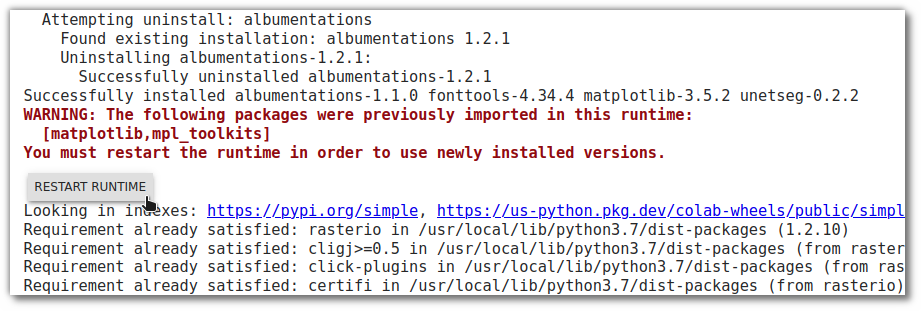

Una vez realizado ese paso, continuamos.

Instalamos unos componentes más... ya casi...

In [ ]:
!pip install -q condacolab
import condacolab
condacolab.install()

⏬ Downloading https://github.com/conda-forge/miniforge/releases/download/23.1.0-1/Mambaforge-23.1.0-1-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:13
🔁 Restarting kernel...


Al completar el paso previo, la sesión de Google Colab se reinicia automáticamente. Todo según lo planeado, continuamos con la ejecución de la siguiente celda.

In [ ]:
!mamba install -q gdal=3.4.1

Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... done


## Obteniendo un modelo pre-entrenado de detección de basurales



Entrenar una red neuronal capaz de identificar basura -o cualquier otra categoría de objetos de interés- requiere de un esfuerzo considerable dedicado a generar datos pre-clasificados para utilizar como referencia. En nuestro caso, una buena cantidad de imágenes donde la presencia de basura ya ha sido delimitada (o etiquetada, en la jerga del _machine learning_) "a mano", por labor humana. A esto llamamos un _dataset_ de entrenamiento.

Disponiendo de un conjunto ya etiquetado de imágenes, el siguiente paso es usarlo como input de una red neuronal de segmentación de imagen. Esta red neuronal no es otra cosa que una serie de operaciones matemáticas, determinadas por prueba y error mediante enorme potencia de procesamiento, que "aprenden" a detectar los patrones de formas, colores y posiciones en una imagen que con mayor frecuencia coinciden con la presencia del objeto de interés, demarcado manualmente en las imágenes de entrenamiento.

Este proceso produce un "modelo", un archivo que contiene instrucciones -un algoritmo- para realizar las operaciones sobre el input que han resultado en mejor capacidad de detección. Este modelo luego puede ser alimentado con imágenes nuevas, sin clasifiación previa, para obtener "predicciones": esto es, áreas en las imagenes donde se determina que existe una alta posibilidad de basura.

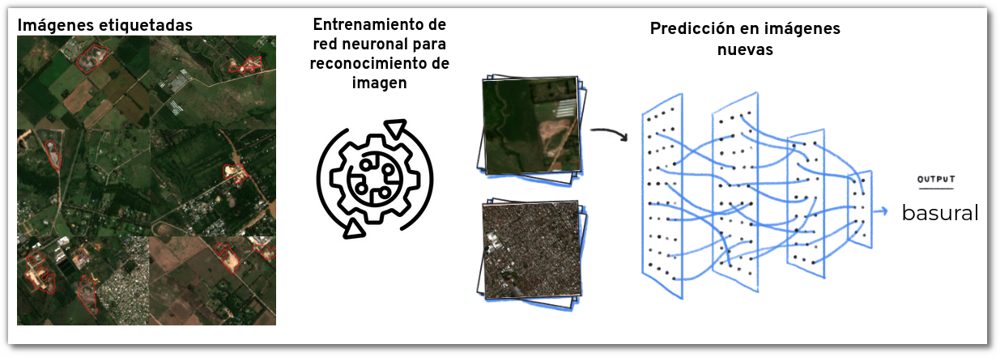

En alianza con la Municipalidad de la Ciudad de Mendoza, un equipo de la Fundación Bunge y Born entrenó un modelo capaz de detectar y determinar los contornos de micro-microbasurales en la trama urbana y peri-urbana.

Durante su entrenamiento, el modelo fue optimizado para detectar basurales presentando las siguientes clases de material predominante:

- plástico
- ramas (residuos de poda)
- ladrillos
- piedras y escombros
- maderas
- chapas y otros desechos metálicos

Este modelo pre-entrenado puede ser aprovechado para analizar nuevas imágenes, incluso de otras ciudades, donde no se conoce a priori la existencia de basurales. A pesar de que el contexto puede ser distinto, es esperable que el algoritmo de todas formas realice predicciones útiles. La facilidad de implementación puede permitir un monitoreo de basurales de forma rápida y frecuente, en mucho menor tiempo que el que le tomaría a especialistas dedicado a esa tarea.

Esta es la URL donde hemos dejado disponible el modelo pre-entrenado:

In [ ]:
url_modelo = "https://basurales.s3.amazonaws.com/mendoza/modelos/UNet_basurales_mendoza_256_90_monoclase_augmentation_10.h5"

Y lo descargamos. El archivo queda en el directorio donde estamos ejecutando el código.

In [ ]:
!wget {url_modelo} -O modelo_deteccion_basura.h5

--2023-07-04 22:06:00--  https://basurales.s3.amazonaws.com/mendoza/modelos/UNet_basurales_mendoza_256_90_monoclase_augmentation_10.h5
Resolving basurales.s3.amazonaws.com (basurales.s3.amazonaws.com)... 3.5.28.19, 3.5.28.132, 52.216.209.41, ...
Connecting to basurales.s3.amazonaws.com (basurales.s3.amazonaws.com)|3.5.28.19|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 373556304 (356M) [binary/octet-stream]
Saving to: ‘modelo_deteccion_basura.h5’

modelo_deteccion_ba 100%[===================>] 356.25M  12.8MB/s    in 40s     

2023-07-04 22:06:41 (8.93 MB/s) - ‘modelo_deteccion_basura.h5’ saved [373556304/373556304]



Siguiente paso: obtener imágenes aéreas, de alta resolución, donde detectar basurales.



## Obtención de imagen aérea de alta resolución


A diferencia de los grandes basurales a cielo abierto, que son visibles en [imágenes satelitales de acceso público](https://apps.sentinel-hub.com/eo-browser/), los micro-basurales ocupan superficies relativamente pequeñas y sólo pueden ser observados en imagen aérea como la que se captura con vuelos de dron. Por su utilidad para múltiples aspectos de la gestión urbana, en ocasiones los municipios obtienen estas imágenes. Con ello ya se dispone del elemento más difícil de conseguir para realizar la detección de basurales. Para practicar aquí, utilizaremos imágenes compartidas en [OpenAerialMap](https://map.openaerialmap.org), un servicio online que permite buscar y descargar imágenes aéreas producidas por drones, de libre acceso.

Elegimos esta [imagen aérea](https://map.openaerialmap.org/#/-60.595232248306274,-33.907180489868445,16/square/2103210231303003/5fe36b91ff40f100073ca182?_k=ph7qk0), de considerable extensión, que captura territorio urbano y periurbano. Fue producida y publicada con licencia abierta por el [Municipio de Pergamino en la Provincia de Buenos Aires, Argentina](http://www.pergamino.gob.ar/ide/).

Luce así:

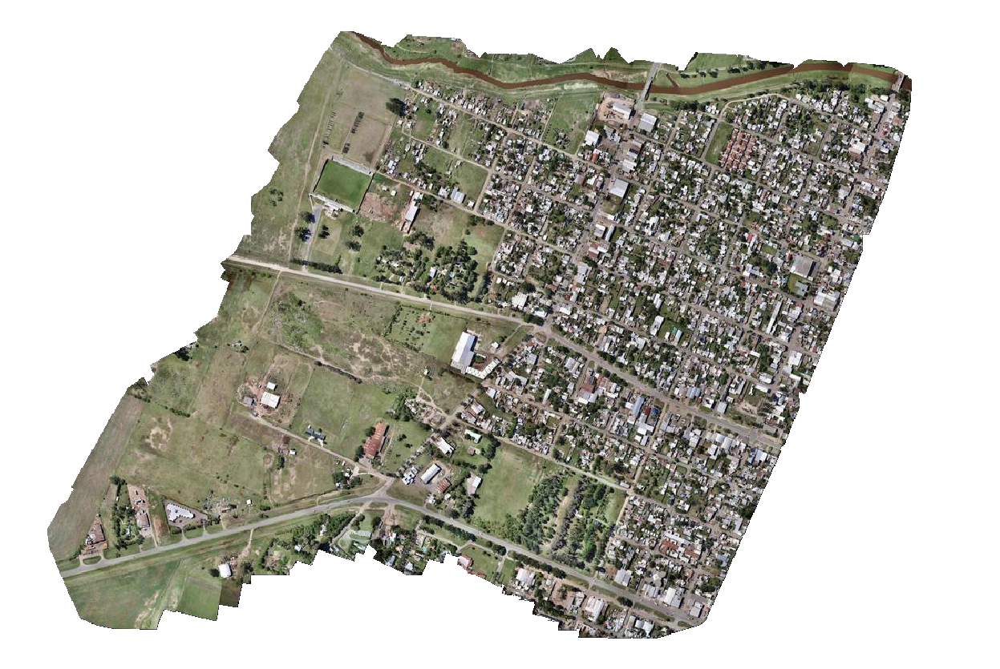

*Imágen aérea producida por la [Municipalidad de Pergamino](https://www.pergamino.gob.ar/ide/) publicada bajo licencia abierta [CC BY-SA 4.0](https://creativecommons.org/licenses/by-sa/4.0/deed.es).*

La imagen tiene una resolución de 3 cm por pixel -¡muy alta!- y esto permite identificar, por inspección visual, la presencia de basura.

Esto se verifica al hacer zoom:

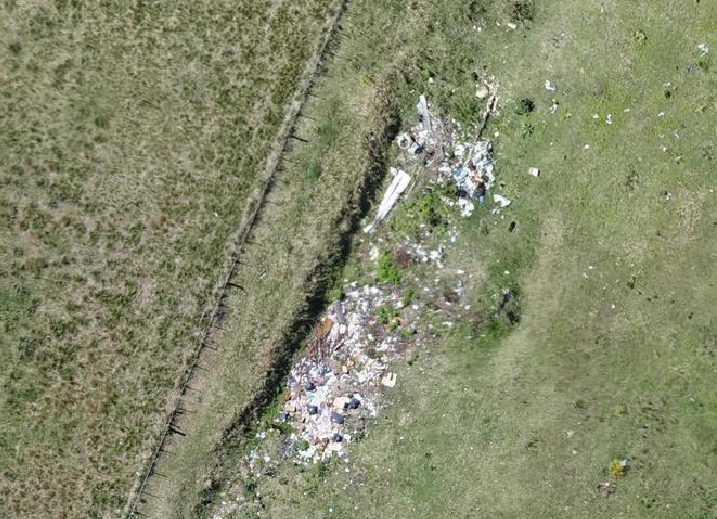

A descargar entonces.

Copiamos el link al que apunta el ícono de descarga, y lo usamos para obtener el archivo y guardarlo en el sistema donde corre esta instancia de Google Colab:

In [ ]:
url_imagenes = "https://oin-hotosm.s3.amazonaws.com/5fe3689aff40f100073ca180/0/5fe3689aff40f100073ca181.tif"

In [ ]:
!wget {url_imagenes} -O imagen_aerea.tif

--2023-07-04 22:06:41--  https://oin-hotosm.s3.amazonaws.com/5fe3689aff40f100073ca180/0/5fe3689aff40f100073ca181.tif
Resolving oin-hotosm.s3.amazonaws.com (oin-hotosm.s3.amazonaws.com)... 16.182.39.57, 52.216.108.35, 52.217.232.1, ...
Connecting to oin-hotosm.s3.amazonaws.com (oin-hotosm.s3.amazonaws.com)|16.182.39.57|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 502538636 (479M) [image/tiff]
Saving to: ‘imagen_aerea.tif’

imagen_aerea.tif    100%[===================>] 479.26M  13.1MB/s    in 39s     

2023-07-04 22:07:21 (12.4 MB/s) - ‘imagen_aerea.tif’ saved [502538636/502538636]



## Preprocesamiento: extracción de chips

Vamos a dividir la imagen aérea en una colección de recortes cuadrados (o "chips"), de mucho menor tamaño, para ser analizados uno a uno y detectar la presencia de basura de acuerdo a la predicción de nuestro modelo. Esta es la tarea para la cual vamos a aprovechar las funciones de la librería [satproc](https://github.com/dymaxionlabs/satproc).

Dado que el modelo fue entrenado usando recortes de 256 x 256 píxeles, usaremos ese mismo tamaño para nuestras imágenes a analizar.

Para una imagen grande como la que estamos usando de ejemplo el proceso va a generar decenas de miles recortes, lo cual **puede tomar unos cuantos minutos**. Para aplacar la ansiedad podemos monitorear la salida de la función, que indica la cantidad de imágenes a producir y el porcentaje ya completado.

In [ ]:
input = "imagen_aerea.tif" # Imagen a procesar

salida = "/tmp/chips/"     # Directorio donde dejar los resultados

size = 256                 # tamaño de los "chips" (recortes cuadrados) en píxeles por lado

!satproc_extract_chips \
    $input \
    -o $salida \
    --size $size \
    --step-size $size \
    --rescale

/bin/bash: line 1: satproc_extract_chips: command not found


El resultado es una carpeta con los "chips", los cuadrados en los cuales fue recortada la imagen original.

Lucen así:

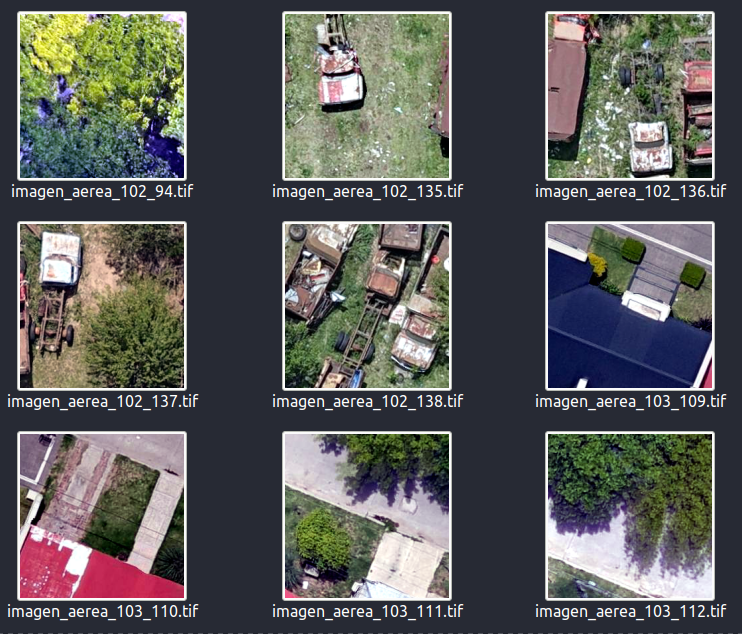

Estas imágenes estan listas para ser convertidas en pequeñas matrices númericas, el formato que consumen las redes neuronales. Próximo paso: procesarlas con nuestro modelo de detección de basurales a ver que encuentra.

## Detección

Con la imágen aérea ya transformada en una pila de pequeños recortes que podemos alimentar a nuestra red neuronal, estamis listos para ponerla a trabajar.

En este paso es donde empleamos funciones de la librería [unetseg](https://github.com/dymaxionlabs/unetseg), que simplifican la tarea. Esencialmente, con indicarle dónde están las imagenes (chips) a analizar, y el archivo que contiene el modelo ya entrenado, se encargar de generar las _predicciones_. Esto es, pasa cada imagen por el modelo de detección y devuelve un archivo del mismo tamaño, donde indica para cada píxel la probabilidad de que éste muestre basura.

Por ejemplo, dos imágenes de imput con sus respectivos outputs: la intensidad del color amarillo indica las áreas donde la red neuronal predice con mayor certeza la presencia de basura:


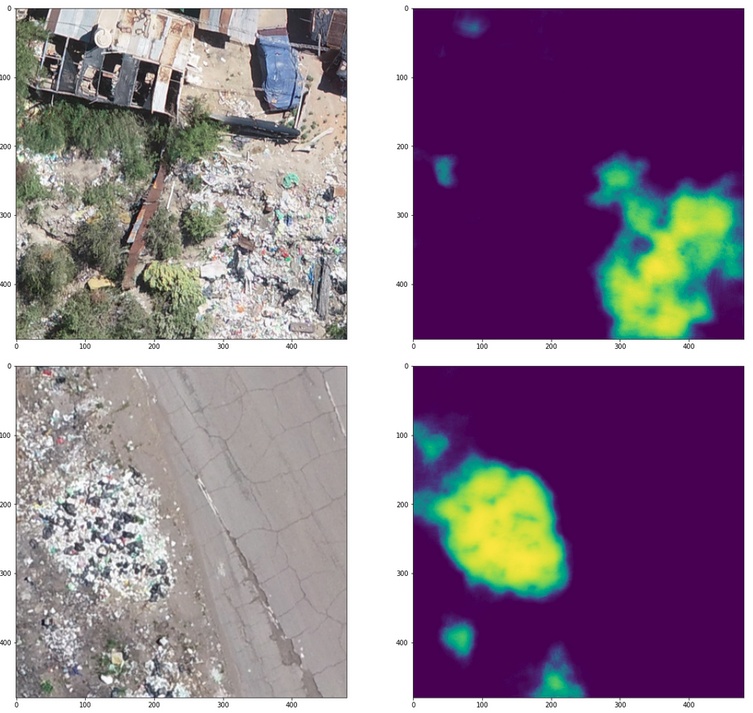

Preparemos entonces la tarea, especificando las opciones necesarias:

In [ ]:
from unetseg.predict import PredictConfig, predict
from unetseg.evaluate import plot_data_generator, plot_data_results

# batch size: cantidad de datos que se procesan por vez, puede ser limitado por
# la memoria de gpu disponible
batch = 64

# tamaño de la imagen procesada por la UNet (debe ser multiplos de 16 , por ej 160, 320, etc)
# y lo mas parecida posible a la resolucion de los chips
unet_input_size = 256

# cantidad de clases a detectar
clases = 1

# Nombre de archivo del modelo a usar
modelo = "modelo_deteccion_basura.h5"

# Directorio con las imágenes (chips) a analizar
imagenes = "/tmp/chips/"

# Directorio donde dejar los resultados
resultados = "/tmp/chips_predicciones/"


predict_config = PredictConfig(images_path = imagenes,
                               results_path = resultados,
                               batch_size = batch,
                               model_path = modelo,
                               height = unet_input_size,
                               width = unet_input_size,
                               n_channels = 3, # porque trabajamos con imagen a color, 3 canales: Red, Green, Blue
                               n_classes = clases)


Y ahora, a predecir. Nuevamente, mientras se ejecuta el proceso obtendremos estimados de tiempo transcurrido y restante:

In [ ]:
predict(predict_config)

Total images to predict (/tmp/chips/images/*.tif): 43575
After skipping existing results: 43575


  0%|          | 0/681 [00:00<?, ?it/s]

2/2 [==============================] - 14s 22ms/step


  0%|          | 1/681 [00:21<4:08:54, 21.96s/it]

2/2 [==============================] - 0s 212ms/step


  0%|          | 2/681 [00:23<1:51:06,  9.82s/it]

2/2 [==============================] - 0s 155ms/step


  0%|          | 3/681 [00:24<1:07:43,  5.99s/it]

2/2 [==============================] - 0s 154ms/step


  1%|          | 4/681 [00:25<46:05,  4.09s/it]  

2/2 [==============================] - 0s 158ms/step


  1%|          | 5/681 [00:27<36:01,  3.20s/it]

2/2 [==============================] - 0s 158ms/step


  1%|          | 6/681 [00:28<29:15,  2.60s/it]

2/2 [==============================] - 0s 160ms/step


  1%|          | 7/681 [00:30<25:50,  2.30s/it]

2/2 [==============================] - 0s 156ms/step


  1%|          | 8/681 [00:32<22:35,  2.01s/it]

2/2 [==============================] - 0s 161ms/step


  1%|▏         | 9/681 [00:33<20:32,  1.83s/it]

2/2 [==============================] - 0s 152ms/step


  1%|▏         | 10/681 [00:35<20:18,  1.82s/it]

2/2 [==============================] - 0s 155ms/step


  2%|▏         | 11/681 [00:36<17:50,  1.60s/it]

2/2 [==============================] - 0s 156ms/step


  2%|▏         | 12/681 [00:37<16:11,  1.45s/it]

2/2 [==============================] - 0s 156ms/step


  2%|▏         | 13/681 [00:38<16:04,  1.44s/it]

2/2 [==============================] - 0s 154ms/step


  2%|▏         | 14/681 [00:40<14:58,  1.35s/it]

2/2 [==============================] - 0s 155ms/step


  2%|▏         | 15/681 [00:41<14:07,  1.27s/it]

2/2 [==============================] - 0s 156ms/step


  2%|▏         | 16/681 [00:42<14:32,  1.31s/it]

2/2 [==============================] - 0s 155ms/step


  2%|▏         | 17/681 [00:43<15:04,  1.36s/it]

2/2 [==============================] - 0s 156ms/step


  3%|▎         | 18/681 [00:45<14:15,  1.29s/it]

2/2 [==============================] - 0s 159ms/step


  3%|▎         | 19/681 [00:46<14:24,  1.31s/it]

2/2 [==============================] - 0s 157ms/step


  3%|▎         | 20/681 [00:47<14:31,  1.32s/it]

2/2 [==============================] - 0s 158ms/step


  3%|▎         | 21/681 [00:49<14:54,  1.36s/it]

2/2 [==============================] - 0s 157ms/step


  3%|▎         | 22/681 [00:50<14:58,  1.36s/it]

2/2 [==============================] - 0s 160ms/step


  3%|▎         | 23/681 [00:52<15:58,  1.46s/it]

2/2 [==============================] - 0s 156ms/step


  4%|▎         | 24/681 [00:54<16:45,  1.53s/it]

2/2 [==============================] - 0s 157ms/step


  4%|▎         | 25/681 [00:55<16:39,  1.52s/it]

2/2 [==============================] - 0s 156ms/step


  4%|▍         | 26/681 [00:56<16:22,  1.50s/it]

2/2 [==============================] - 0s 157ms/step


  4%|▍         | 27/681 [00:58<16:20,  1.50s/it]

2/2 [==============================] - 0s 157ms/step


  4%|▍         | 28/681 [00:59<15:00,  1.38s/it]

2/2 [==============================] - 0s 157ms/step


  4%|▍         | 29/681 [01:00<14:58,  1.38s/it]

2/2 [==============================] - 0s 157ms/step


  4%|▍         | 30/681 [01:02<15:03,  1.39s/it]

2/2 [==============================] - 0s 157ms/step


  5%|▍         | 31/681 [01:03<14:12,  1.31s/it]

2/2 [==============================] - 0s 161ms/step


  5%|▍         | 32/681 [01:04<14:47,  1.37s/it]

2/2 [==============================] - 0s 153ms/step


  5%|▍         | 33/681 [01:06<15:53,  1.47s/it]

2/2 [==============================] - 0s 165ms/step


  5%|▍         | 34/681 [01:08<16:51,  1.56s/it]

2/2 [==============================] - 0s 154ms/step


  5%|▌         | 35/681 [01:10<17:16,  1.60s/it]

2/2 [==============================] - 0s 161ms/step


  5%|▌         | 36/681 [01:11<16:22,  1.52s/it]

2/2 [==============================] - 0s 159ms/step


  5%|▌         | 37/681 [01:12<15:49,  1.47s/it]

2/2 [==============================] - 0s 164ms/step


  6%|▌         | 38/681 [01:14<15:39,  1.46s/it]

2/2 [==============================] - 0s 167ms/step


  6%|▌         | 39/681 [01:15<15:31,  1.45s/it]

2/2 [==============================] - 0s 162ms/step


  6%|▌         | 40/681 [01:17<15:29,  1.45s/it]

2/2 [==============================] - 0s 160ms/step


  6%|▌         | 41/681 [01:18<15:21,  1.44s/it]

2/2 [==============================] - 0s 159ms/step


  6%|▌         | 42/681 [01:19<15:14,  1.43s/it]

2/2 [==============================] - 0s 158ms/step


  6%|▋         | 43/681 [01:21<15:20,  1.44s/it]

2/2 [==============================] - 0s 158ms/step


  6%|▋         | 44/681 [01:22<15:10,  1.43s/it]

2/2 [==============================] - 0s 163ms/step


  7%|▋         | 45/681 [01:24<15:46,  1.49s/it]

2/2 [==============================] - 0s 163ms/step


  7%|▋         | 46/681 [01:26<16:18,  1.54s/it]

2/2 [==============================] - 0s 167ms/step


  7%|▋         | 47/681 [01:27<16:35,  1.57s/it]

2/2 [==============================] - 0s 166ms/step


  7%|▋         | 48/681 [01:29<15:57,  1.51s/it]

2/2 [==============================] - 0s 164ms/step


  7%|▋         | 49/681 [01:30<15:29,  1.47s/it]

2/2 [==============================] - 0s 161ms/step


  7%|▋         | 50/681 [01:31<15:09,  1.44s/it]

2/2 [==============================] - 0s 162ms/step


  7%|▋         | 51/681 [01:33<15:10,  1.44s/it]

2/2 [==============================] - 0s 159ms/step


  8%|▊         | 52/681 [01:34<14:23,  1.37s/it]

2/2 [==============================] - 0s 162ms/step


  8%|▊         | 53/681 [01:35<14:27,  1.38s/it]

2/2 [==============================] - 0s 160ms/step


  8%|▊         | 54/681 [01:37<14:31,  1.39s/it]

2/2 [==============================] - 0s 159ms/step


  8%|▊         | 55/681 [01:38<13:36,  1.30s/it]

2/2 [==============================] - 0s 162ms/step


  8%|▊         | 56/681 [01:39<13:59,  1.34s/it]

2/2 [==============================] - 0s 165ms/step


  8%|▊         | 57/681 [01:41<13:12,  1.27s/it]

2/2 [==============================] - 0s 162ms/step


  9%|▊         | 58/681 [01:42<13:49,  1.33s/it]

2/2 [==============================] - 0s 168ms/step


  9%|▊         | 59/681 [01:44<14:56,  1.44s/it]

2/2 [==============================] - 0s 170ms/step


  9%|▉         | 60/681 [01:45<14:58,  1.45s/it]

2/2 [==============================] - 0s 167ms/step


  9%|▉         | 61/681 [01:47<15:15,  1.48s/it]

2/2 [==============================] - 0s 163ms/step


  9%|▉         | 62/681 [01:48<15:52,  1.54s/it]

2/2 [==============================] - 0s 169ms/step


  9%|▉         | 63/681 [01:50<16:10,  1.57s/it]

2/2 [==============================] - 0s 161ms/step


  9%|▉         | 64/681 [01:52<15:51,  1.54s/it]

2/2 [==============================] - 0s 163ms/step


 10%|▉         | 65/681 [01:53<14:40,  1.43s/it]

2/2 [==============================] - 0s 164ms/step


 10%|▉         | 66/681 [01:54<14:40,  1.43s/it]

2/2 [==============================] - 0s 160ms/step


 10%|▉         | 67/681 [01:55<13:53,  1.36s/it]

2/2 [==============================] - 0s 164ms/step


 10%|▉         | 68/681 [01:57<14:13,  1.39s/it]

2/2 [==============================] - 0s 162ms/step


 10%|█         | 69/681 [01:58<14:22,  1.41s/it]

2/2 [==============================] - 0s 162ms/step


 10%|█         | 70/681 [02:00<14:18,  1.40s/it]

2/2 [==============================] - 0s 172ms/step


 10%|█         | 71/681 [02:01<13:39,  1.34s/it]

2/2 [==============================] - 0s 143ms/step


 11%|█         | 72/681 [02:03<14:44,  1.45s/it]

2/2 [==============================] - 0s 166ms/step


 11%|█         | 73/681 [02:04<14:48,  1.46s/it]

2/2 [==============================] - 0s 167ms/step


 11%|█         | 74/681 [02:05<14:49,  1.46s/it]

2/2 [==============================] - 0s 167ms/step


 11%|█         | 75/681 [02:07<15:39,  1.55s/it]

2/2 [==============================] - 0s 166ms/step


 11%|█         | 76/681 [02:09<16:18,  1.62s/it]

2/2 [==============================] - 0s 163ms/step


 11%|█▏        | 77/681 [02:11<16:05,  1.60s/it]

2/2 [==============================] - 0s 166ms/step


 11%|█▏        | 78/681 [02:12<15:30,  1.54s/it]

2/2 [==============================] - 0s 165ms/step


 12%|█▏        | 79/681 [02:13<14:20,  1.43s/it]

2/2 [==============================] - 0s 165ms/step


 12%|█▏        | 80/681 [02:15<14:18,  1.43s/it]

2/2 [==============================] - 0s 166ms/step


 12%|█▏        | 81/681 [02:16<14:16,  1.43s/it]

2/2 [==============================] - 0s 162ms/step


 12%|█▏        | 82/681 [02:17<14:20,  1.44s/it]

2/2 [==============================] - 0s 167ms/step


 12%|█▏        | 83/681 [02:19<13:31,  1.36s/it]

2/2 [==============================] - 0s 172ms/step


 12%|█▏        | 84/681 [02:20<13:15,  1.33s/it]

2/2 [==============================] - 0s 169ms/step


 12%|█▏        | 85/681 [02:21<13:38,  1.37s/it]

2/2 [==============================] - 0s 170ms/step


 13%|█▎        | 86/681 [02:23<14:00,  1.41s/it]

2/2 [==============================] - 0s 176ms/step


 13%|█▎        | 87/681 [02:25<14:58,  1.51s/it]

2/2 [==============================] - 0s 174ms/step


 13%|█▎        | 88/681 [02:26<14:41,  1.49s/it]

2/2 [==============================] - 0s 171ms/step


 13%|█▎        | 89/681 [02:28<15:18,  1.55s/it]

2/2 [==============================] - 0s 164ms/step


 13%|█▎        | 90/681 [02:29<14:45,  1.50s/it]

2/2 [==============================] - 0s 170ms/step


 13%|█▎        | 91/681 [02:31<14:38,  1.49s/it]

2/2 [==============================] - 0s 169ms/step


 14%|█▎        | 92/681 [02:32<14:31,  1.48s/it]

2/2 [==============================] - 0s 172ms/step


 14%|█▎        | 93/681 [02:33<13:37,  1.39s/it]

2/2 [==============================] - 0s 170ms/step


 14%|█▍        | 94/681 [02:34<13:03,  1.33s/it]

2/2 [==============================] - 0s 169ms/step


 14%|█▍        | 95/681 [02:36<12:28,  1.28s/it]

2/2 [==============================] - 0s 168ms/step


 14%|█▍        | 96/681 [02:37<12:10,  1.25s/it]

2/2 [==============================] - 0s 173ms/step


 14%|█▍        | 97/681 [02:38<12:44,  1.31s/it]

2/2 [==============================] - 0s 178ms/step


 14%|█▍        | 98/681 [02:40<13:34,  1.40s/it]

2/2 [==============================] - 0s 177ms/step


 15%|█▍        | 99/681 [02:41<13:51,  1.43s/it]

2/2 [==============================] - 0s 171ms/step


 15%|█▍        | 100/681 [02:43<14:58,  1.55s/it]

2/2 [==============================] - 0s 176ms/step


 15%|█▍        | 101/681 [02:45<15:43,  1.63s/it]

2/2 [==============================] - 0s 181ms/step


 15%|█▍        | 102/681 [02:47<15:58,  1.66s/it]

2/2 [==============================] - 0s 190ms/step


 15%|█▌        | 103/681 [02:48<15:21,  1.59s/it]

2/2 [==============================] - 0s 173ms/step


 15%|█▌        | 104/681 [02:50<15:03,  1.57s/it]

2/2 [==============================] - 0s 169ms/step


 15%|█▌        | 105/681 [02:51<13:47,  1.44s/it]

2/2 [==============================] - 0s 172ms/step


 16%|█▌        | 106/681 [02:52<13:42,  1.43s/it]

2/2 [==============================] - 0s 170ms/step


 16%|█▌        | 107/681 [02:53<12:58,  1.36s/it]

2/2 [==============================] - 0s 172ms/step


 16%|█▌        | 108/681 [02:55<13:11,  1.38s/it]

2/2 [==============================] - 0s 175ms/step


 16%|█▌        | 109/681 [02:56<12:51,  1.35s/it]

2/2 [==============================] - 0s 174ms/step


 16%|█▌        | 110/681 [02:57<12:22,  1.30s/it]

2/2 [==============================] - 0s 186ms/step


 16%|█▋        | 111/681 [02:59<12:55,  1.36s/it]

2/2 [==============================] - 0s 175ms/step


 16%|█▋        | 112/681 [03:00<13:38,  1.44s/it]

2/2 [==============================] - 0s 177ms/step


 17%|█▋        | 113/681 [03:02<14:15,  1.51s/it]

2/2 [==============================] - 0s 186ms/step


 17%|█▋        | 114/681 [03:03<14:02,  1.49s/it]

2/2 [==============================] - 0s 178ms/step


 17%|█▋        | 115/681 [03:05<14:09,  1.50s/it]

2/2 [==============================] - 0s 182ms/step


 17%|█▋        | 116/681 [03:06<13:58,  1.48s/it]

2/2 [==============================] - 0s 174ms/step


 17%|█▋        | 117/681 [03:08<13:42,  1.46s/it]

2/2 [==============================] - 0s 177ms/step


 17%|█▋        | 118/681 [03:09<13:01,  1.39s/it]

2/2 [==============================] - 0s 174ms/step


 17%|█▋        | 119/681 [03:10<13:05,  1.40s/it]

2/2 [==============================] - 0s 170ms/step


 18%|█▊        | 120/681 [03:12<13:05,  1.40s/it]

2/2 [==============================] - 0s 174ms/step


 18%|█▊        | 121/681 [03:13<12:21,  1.32s/it]

2/2 [==============================] - 0s 170ms/step


 18%|█▊        | 122/681 [03:14<11:51,  1.27s/it]

2/2 [==============================] - 0s 174ms/step


 18%|█▊        | 123/681 [03:16<12:17,  1.32s/it]

2/2 [==============================] - 0s 177ms/step


 18%|█▊        | 124/681 [03:17<12:38,  1.36s/it]

2/2 [==============================] - 0s 176ms/step


 18%|█▊        | 125/681 [03:19<13:21,  1.44s/it]

2/2 [==============================] - 0s 179ms/step


 19%|█▊        | 126/681 [03:20<13:25,  1.45s/it]

2/2 [==============================] - 0s 174ms/step


 19%|█▊        | 127/681 [03:22<14:14,  1.54s/it]

2/2 [==============================] - 0s 177ms/step


 19%|█▉        | 128/681 [03:23<14:01,  1.52s/it]

2/2 [==============================] - 0s 176ms/step


 19%|█▉        | 129/681 [03:25<13:47,  1.50s/it]

2/2 [==============================] - 0s 177ms/step


 19%|█▉        | 130/681 [03:26<13:28,  1.47s/it]

2/2 [==============================] - 0s 173ms/step


 19%|█▉        | 131/681 [03:28<12:52,  1.41s/it]

2/2 [==============================] - 0s 178ms/step


 19%|█▉        | 132/681 [03:29<12:09,  1.33s/it]

2/2 [==============================] - 0s 174ms/step


 20%|█▉        | 133/681 [03:30<11:43,  1.28s/it]

2/2 [==============================] - 0s 175ms/step


 20%|█▉        | 134/681 [03:31<12:07,  1.33s/it]

2/2 [==============================] - 0s 174ms/step


 20%|█▉        | 135/681 [03:32<11:42,  1.29s/it]

2/2 [==============================] - 0s 170ms/step


 20%|█▉        | 136/681 [03:34<12:00,  1.32s/it]

2/2 [==============================] - 0s 173ms/step


 20%|██        | 137/681 [03:35<11:40,  1.29s/it]

2/2 [==============================] - 0s 173ms/step


 20%|██        | 138/681 [03:36<11:12,  1.24s/it]

2/2 [==============================] - 0s 176ms/step


 20%|██        | 139/681 [03:38<12:00,  1.33s/it]

2/2 [==============================] - 0s 168ms/step


 21%|██        | 140/681 [03:39<13:02,  1.45s/it]

2/2 [==============================] - 0s 174ms/step


 21%|██        | 141/681 [03:41<13:42,  1.52s/it]

2/2 [==============================] - 0s 176ms/step


 21%|██        | 142/681 [03:43<13:26,  1.50s/it]

2/2 [==============================] - 0s 169ms/step


 21%|██        | 143/681 [03:44<13:56,  1.55s/it]

2/2 [==============================] - 0s 173ms/step


 21%|██        | 144/681 [03:46<14:03,  1.57s/it]

2/2 [==============================] - 0s 167ms/step


 21%|██▏       | 145/681 [03:47<12:57,  1.45s/it]

2/2 [==============================] - 0s 176ms/step


 21%|██▏       | 146/681 [03:48<12:45,  1.43s/it]

2/2 [==============================] - 0s 170ms/step


 22%|██▏       | 147/681 [03:50<12:44,  1.43s/it]

2/2 [==============================] - 0s 173ms/step


 22%|██▏       | 148/681 [03:51<12:00,  1.35s/it]

2/2 [==============================] - 0s 171ms/step


 22%|██▏       | 149/681 [03:52<11:23,  1.28s/it]

2/2 [==============================] - 0s 172ms/step


 22%|██▏       | 150/681 [03:53<11:06,  1.26s/it]

2/2 [==============================] - 0s 174ms/step


 22%|██▏       | 151/681 [03:55<11:33,  1.31s/it]

2/2 [==============================] - 0s 175ms/step


 22%|██▏       | 152/681 [03:56<12:05,  1.37s/it]

2/2 [==============================] - 0s 179ms/step


 22%|██▏       | 153/681 [03:58<12:11,  1.39s/it]

2/2 [==============================] - 0s 174ms/step


 23%|██▎       | 154/681 [03:59<12:16,  1.40s/it]

2/2 [==============================] - 0s 177ms/step


 23%|██▎       | 155/681 [04:01<12:54,  1.47s/it]

2/2 [==============================] - 0s 173ms/step


 23%|██▎       | 156/681 [04:02<13:20,  1.52s/it]

2/2 [==============================] - 0s 170ms/step


 23%|██▎       | 157/681 [04:04<13:00,  1.49s/it]

2/2 [==============================] - 0s 170ms/step


 23%|██▎       | 158/681 [04:06<13:23,  1.54s/it]

2/2 [==============================] - 0s 170ms/step


 23%|██▎       | 159/681 [04:07<12:27,  1.43s/it]

2/2 [==============================] - 0s 174ms/step


 23%|██▎       | 160/681 [04:08<12:28,  1.44s/it]

2/2 [==============================] - 0s 172ms/step


 24%|██▎       | 161/681 [04:09<11:43,  1.35s/it]

2/2 [==============================] - 0s 173ms/step


 24%|██▍       | 162/681 [04:11<11:50,  1.37s/it]

2/2 [==============================] - 0s 170ms/step


 24%|██▍       | 163/681 [04:12<11:53,  1.38s/it]

2/2 [==============================] - 0s 171ms/step


 24%|██▍       | 164/681 [04:14<11:56,  1.39s/it]

2/2 [==============================] - 0s 174ms/step


 24%|██▍       | 165/681 [04:15<12:04,  1.40s/it]

2/2 [==============================] - 0s 180ms/step


 24%|██▍       | 166/681 [04:17<12:55,  1.51s/it]

2/2 [==============================] - 0s 175ms/step


 25%|██▍       | 167/681 [04:18<12:47,  1.49s/it]

2/2 [==============================] - 0s 177ms/step


 25%|██▍       | 168/681 [04:20<13:28,  1.58s/it]

2/2 [==============================] - 0s 178ms/step


 25%|██▍       | 169/681 [04:22<13:37,  1.60s/it]

2/2 [==============================] - 0s 172ms/step


 25%|██▍       | 170/681 [04:23<13:04,  1.53s/it]

2/2 [==============================] - 0s 177ms/step


 25%|██▌       | 171/681 [04:24<12:30,  1.47s/it]

2/2 [==============================] - 0s 175ms/step


 25%|██▌       | 172/681 [04:26<12:19,  1.45s/it]

2/2 [==============================] - 0s 174ms/step


 25%|██▌       | 173/681 [04:27<12:10,  1.44s/it]

2/2 [==============================] - 0s 170ms/step


 26%|██▌       | 174/681 [04:29<12:06,  1.43s/it]

2/2 [==============================] - 0s 171ms/step


 26%|██▌       | 175/681 [04:30<12:06,  1.44s/it]

2/2 [==============================] - 0s 169ms/step


 26%|██▌       | 176/681 [04:31<12:04,  1.44s/it]

2/2 [==============================] - 0s 173ms/step


 26%|██▌       | 177/681 [04:33<11:22,  1.35s/it]

2/2 [==============================] - 0s 177ms/step


 26%|██▌       | 178/681 [04:34<10:52,  1.30s/it]

2/2 [==============================] - 0s 175ms/step


 26%|██▋       | 179/681 [04:35<11:31,  1.38s/it]

2/2 [==============================] - 0s 171ms/step


 26%|██▋       | 180/681 [04:37<12:15,  1.47s/it]

2/2 [==============================] - 0s 175ms/step


 27%|██▋       | 181/681 [04:38<12:13,  1.47s/it]

2/2 [==============================] - 0s 174ms/step


 27%|██▋       | 182/681 [04:40<12:45,  1.53s/it]

2/2 [==============================] - 0s 176ms/step


 27%|██▋       | 183/681 [04:42<13:11,  1.59s/it]

2/2 [==============================] - 0s 171ms/step


 27%|██▋       | 184/681 [04:43<12:37,  1.52s/it]

2/2 [==============================] - 0s 172ms/step


 27%|██▋       | 185/681 [04:44<11:49,  1.43s/it]

2/2 [==============================] - 0s 174ms/step


 27%|██▋       | 186/681 [04:46<11:10,  1.35s/it]

2/2 [==============================] - 0s 164ms/step


 27%|██▋       | 187/681 [04:47<10:38,  1.29s/it]

2/2 [==============================] - 0s 175ms/step


 28%|██▊       | 188/681 [04:48<10:54,  1.33s/it]

2/2 [==============================] - 0s 174ms/step


 28%|██▊       | 189/681 [04:50<11:04,  1.35s/it]

2/2 [==============================] - 0s 171ms/step


 28%|██▊       | 190/681 [04:51<10:42,  1.31s/it]

2/2 [==============================] - 0s 174ms/step


 28%|██▊       | 191/681 [04:52<11:01,  1.35s/it]

2/2 [==============================] - 0s 171ms/step


 28%|██▊       | 192/681 [04:54<10:53,  1.34s/it]

2/2 [==============================] - 0s 173ms/step


 28%|██▊       | 193/681 [04:55<11:15,  1.38s/it]

2/2 [==============================] - 0s 180ms/step


 28%|██▊       | 194/681 [04:57<11:34,  1.43s/it]

2/2 [==============================] - 0s 170ms/step


 29%|██▊       | 195/681 [04:58<11:30,  1.42s/it]

2/2 [==============================] - 0s 174ms/step


 29%|██▉       | 196/681 [05:00<12:03,  1.49s/it]

2/2 [==============================] - 0s 176ms/step


 29%|██▉       | 197/681 [05:01<12:00,  1.49s/it]

2/2 [==============================] - 0s 172ms/step


 29%|██▉       | 198/681 [05:03<12:28,  1.55s/it]

2/2 [==============================] - 0s 171ms/step


 29%|██▉       | 199/681 [05:04<11:31,  1.44s/it]

2/2 [==============================] - 0s 170ms/step


 29%|██▉       | 200/681 [05:05<11:33,  1.44s/it]

2/2 [==============================] - 0s 167ms/step


 30%|██▉       | 201/681 [05:07<11:32,  1.44s/it]

2/2 [==============================] - 0s 174ms/step


 30%|██▉       | 202/681 [05:08<11:34,  1.45s/it]

2/2 [==============================] - 0s 175ms/step


 30%|██▉       | 203/681 [05:10<11:28,  1.44s/it]

2/2 [==============================] - 0s 167ms/step


 30%|██▉       | 204/681 [05:11<11:26,  1.44s/it]

2/2 [==============================] - 0s 168ms/step


 30%|███       | 205/681 [05:12<10:50,  1.37s/it]

2/2 [==============================] - 0s 175ms/step


 30%|███       | 206/681 [05:14<11:29,  1.45s/it]

2/2 [==============================] - 0s 175ms/step


 30%|███       | 207/681 [05:15<11:28,  1.45s/it]

2/2 [==============================] - 0s 173ms/step


 31%|███       | 208/681 [05:17<11:24,  1.45s/it]

2/2 [==============================] - 0s 173ms/step


 31%|███       | 209/681 [05:18<11:21,  1.44s/it]

2/2 [==============================] - 0s 179ms/step


 31%|███       | 210/681 [05:20<12:07,  1.54s/it]

2/2 [==============================] - 0s 173ms/step


 31%|███       | 211/681 [05:22<12:22,  1.58s/it]

2/2 [==============================] - 0s 168ms/step


 31%|███       | 212/681 [05:23<12:03,  1.54s/it]

2/2 [==============================] - 0s 172ms/step


 31%|███▏      | 213/681 [05:24<11:06,  1.42s/it]

2/2 [==============================] - 0s 166ms/step


 31%|███▏      | 214/681 [05:26<11:01,  1.42s/it]

2/2 [==============================] - 0s 170ms/step


 32%|███▏      | 215/681 [05:27<11:04,  1.43s/it]

2/2 [==============================] - 0s 170ms/step


 32%|███▏      | 216/681 [05:29<11:03,  1.43s/it]

2/2 [==============================] - 0s 174ms/step


 32%|███▏      | 217/681 [05:30<11:05,  1.43s/it]

2/2 [==============================] - 0s 169ms/step


 32%|███▏      | 218/681 [05:32<11:20,  1.47s/it]

2/2 [==============================] - 0s 173ms/step


 32%|███▏      | 219/681 [05:33<11:49,  1.54s/it]

2/2 [==============================] - 0s 174ms/step


 32%|███▏      | 220/681 [05:35<12:06,  1.58s/it]

2/2 [==============================] - 0s 167ms/step


 32%|███▏      | 221/681 [05:36<11:46,  1.54s/it]

2/2 [==============================] - 0s 177ms/step


 33%|███▎      | 222/681 [05:38<12:02,  1.57s/it]

2/2 [==============================] - 0s 171ms/step


 33%|███▎      | 223/681 [05:40<11:42,  1.53s/it]

2/2 [==============================] - 0s 170ms/step


 33%|███▎      | 224/681 [05:41<11:20,  1.49s/it]

2/2 [==============================] - 0s 179ms/step


 33%|███▎      | 225/681 [05:42<11:13,  1.48s/it]

2/2 [==============================] - 0s 170ms/step


 33%|███▎      | 226/681 [05:44<11:06,  1.47s/it]

2/2 [==============================] - 0s 171ms/step


 33%|███▎      | 227/681 [05:45<11:06,  1.47s/it]

2/2 [==============================] - 0s 173ms/step


 33%|███▎      | 228/681 [05:46<10:23,  1.38s/it]

2/2 [==============================] - 0s 175ms/step


 34%|███▎      | 229/681 [05:48<10:27,  1.39s/it]

2/2 [==============================] - 0s 171ms/step


 34%|███▍      | 230/681 [05:49<10:27,  1.39s/it]

2/2 [==============================] - 0s 176ms/step


 34%|███▍      | 231/681 [05:50<09:54,  1.32s/it]

2/2 [==============================] - 0s 174ms/step


 34%|███▍      | 232/681 [05:52<10:16,  1.37s/it]

2/2 [==============================] - 0s 174ms/step


 34%|███▍      | 233/681 [05:53<10:26,  1.40s/it]

2/2 [==============================] - 0s 181ms/step


 34%|███▍      | 234/681 [05:55<11:04,  1.49s/it]

2/2 [==============================] - 0s 171ms/step


 35%|███▍      | 235/681 [05:57<11:16,  1.52s/it]

2/2 [==============================] - 0s 178ms/step


 35%|███▍      | 236/681 [05:58<11:01,  1.49s/it]

2/2 [==============================] - 0s 174ms/step


 35%|███▍      | 237/681 [06:00<11:12,  1.51s/it]

2/2 [==============================] - 0s 176ms/step


 35%|███▍      | 238/681 [06:01<10:22,  1.40s/it]

2/2 [==============================] - 0s 173ms/step


 35%|███▌      | 239/681 [06:02<09:51,  1.34s/it]

2/2 [==============================] - 0s 171ms/step


 35%|███▌      | 240/681 [06:03<10:06,  1.38s/it]

2/2 [==============================] - 0s 173ms/step


 35%|███▌      | 241/681 [06:05<10:12,  1.39s/it]

2/2 [==============================] - 0s 173ms/step


 36%|███▌      | 242/681 [06:06<10:18,  1.41s/it]

2/2 [==============================] - 0s 175ms/step


 36%|███▌      | 243/681 [06:08<10:22,  1.42s/it]

2/2 [==============================] - 0s 170ms/step


 36%|███▌      | 244/681 [06:09<10:17,  1.41s/it]

2/2 [==============================] - 0s 178ms/step


 36%|███▌      | 245/681 [06:11<10:31,  1.45s/it]

2/2 [==============================] - 0s 178ms/step


 36%|███▌      | 246/681 [06:12<10:58,  1.51s/it]

2/2 [==============================] - 0s 176ms/step


 36%|███▋      | 247/681 [06:14<11:14,  1.55s/it]

2/2 [==============================] - 0s 172ms/step


 36%|███▋      | 248/681 [06:15<10:56,  1.52s/it]

2/2 [==============================] - 0s 172ms/step


 37%|███▋      | 249/681 [06:17<10:47,  1.50s/it]

2/2 [==============================] - 0s 170ms/step


 37%|███▋      | 250/681 [06:19<11:02,  1.54s/it]

2/2 [==============================] - 0s 171ms/step


 37%|███▋      | 251/681 [06:20<10:49,  1.51s/it]

2/2 [==============================] - 0s 173ms/step


 37%|███▋      | 252/681 [06:21<10:38,  1.49s/it]

2/2 [==============================] - 0s 168ms/step


 37%|███▋      | 253/681 [06:23<10:27,  1.47s/it]

2/2 [==============================] - 0s 176ms/step


 37%|███▋      | 254/681 [06:24<09:50,  1.38s/it]

2/2 [==============================] - 0s 173ms/step


 37%|███▋      | 255/681 [06:26<09:57,  1.40s/it]

2/2 [==============================] - 0s 177ms/step


 38%|███▊      | 256/681 [06:27<09:22,  1.32s/it]

2/2 [==============================] - 0s 169ms/step


 38%|███▊      | 257/681 [06:28<09:01,  1.28s/it]

2/2 [==============================] - 0s 172ms/step


 38%|███▊      | 258/681 [06:29<09:28,  1.34s/it]

2/2 [==============================] - 0s 171ms/step


 38%|███▊      | 259/681 [06:31<09:43,  1.38s/it]

2/2 [==============================] - 0s 170ms/step


 38%|███▊      | 260/681 [06:32<10:01,  1.43s/it]

2/2 [==============================] - 0s 178ms/step


 38%|███▊      | 261/681 [06:34<10:29,  1.50s/it]

2/2 [==============================] - 0s 173ms/step


 38%|███▊      | 262/681 [06:35<10:21,  1.48s/it]

2/2 [==============================] - 0s 170ms/step


 39%|███▊      | 263/681 [06:37<10:13,  1.47s/it]

2/2 [==============================] - 0s 171ms/step


 39%|███▉      | 264/681 [06:38<10:28,  1.51s/it]

2/2 [==============================] - 0s 179ms/step


 39%|███▉      | 265/681 [06:40<10:17,  1.49s/it]

2/2 [==============================] - 0s 171ms/step


 39%|███▉      | 266/681 [06:41<10:07,  1.46s/it]

2/2 [==============================] - 0s 173ms/step


 39%|███▉      | 267/681 [06:42<09:30,  1.38s/it]

2/2 [==============================] - 0s 167ms/step


 39%|███▉      | 268/681 [06:44<09:04,  1.32s/it]

2/2 [==============================] - 0s 168ms/step


 40%|███▉      | 269/681 [06:45<08:45,  1.28s/it]

2/2 [==============================] - 0s 190ms/step


 40%|███▉      | 270/681 [06:46<08:32,  1.25s/it]

2/2 [==============================] - 0s 170ms/step


 40%|███▉      | 271/681 [06:47<08:48,  1.29s/it]

2/2 [==============================] - 0s 170ms/step


 40%|███▉      | 272/681 [06:49<08:54,  1.31s/it]

2/2 [==============================] - 0s 172ms/step


 40%|████      | 273/681 [06:50<09:13,  1.36s/it]

2/2 [==============================] - 0s 174ms/step


 40%|████      | 274/681 [06:52<09:52,  1.45s/it]

2/2 [==============================] - 0s 168ms/step


 40%|████      | 275/681 [06:53<09:50,  1.45s/it]

2/2 [==============================] - 0s 171ms/step


 41%|████      | 276/681 [06:55<10:05,  1.49s/it]

2/2 [==============================] - 0s 170ms/step


 41%|████      | 277/681 [06:56<09:56,  1.48s/it]

2/2 [==============================] - 0s 167ms/step


 41%|████      | 278/681 [06:58<09:58,  1.48s/it]

2/2 [==============================] - 0s 173ms/step


 41%|████      | 279/681 [06:59<09:15,  1.38s/it]

2/2 [==============================] - 0s 172ms/step


 41%|████      | 280/681 [07:00<09:15,  1.39s/it]

2/2 [==============================] - 0s 173ms/step


 41%|████▏     | 281/681 [07:02<09:18,  1.40s/it]

2/2 [==============================] - 0s 175ms/step


 41%|████▏     | 282/681 [07:03<08:50,  1.33s/it]

2/2 [==============================] - 0s 175ms/step


 42%|████▏     | 283/681 [07:04<09:00,  1.36s/it]

2/2 [==============================] - 0s 175ms/step


 42%|████▏     | 284/681 [07:06<09:13,  1.39s/it]

2/2 [==============================] - 0s 169ms/step


 42%|████▏     | 285/681 [07:07<09:25,  1.43s/it]

2/2 [==============================] - 0s 171ms/step


 42%|████▏     | 286/681 [07:09<09:26,  1.43s/it]

2/2 [==============================] - 0s 179ms/step


 42%|████▏     | 287/681 [07:10<09:26,  1.44s/it]

2/2 [==============================] - 0s 173ms/step


 42%|████▏     | 288/681 [07:12<09:22,  1.43s/it]

2/2 [==============================] - 0s 169ms/step


 42%|████▏     | 289/681 [07:13<09:51,  1.51s/it]

2/2 [==============================] - 0s 173ms/step


 43%|████▎     | 290/681 [07:15<09:38,  1.48s/it]

2/2 [==============================] - 0s 172ms/step


 43%|████▎     | 291/681 [07:16<09:38,  1.48s/it]

2/2 [==============================] - 0s 173ms/step


 43%|████▎     | 292/681 [07:18<09:01,  1.39s/it]

2/2 [==============================] - 0s 169ms/step


 43%|████▎     | 293/681 [07:19<09:06,  1.41s/it]

2/2 [==============================] - 0s 172ms/step


 43%|████▎     | 294/681 [07:20<08:39,  1.34s/it]

2/2 [==============================] - 0s 171ms/step


 43%|████▎     | 295/681 [07:21<08:14,  1.28s/it]

2/2 [==============================] - 0s 174ms/step


 43%|████▎     | 296/681 [07:22<08:01,  1.25s/it]

2/2 [==============================] - 0s 176ms/step


 44%|████▎     | 297/681 [07:24<08:19,  1.30s/it]

2/2 [==============================] - 0s 173ms/step


 44%|████▍     | 298/681 [07:25<08:31,  1.34s/it]

2/2 [==============================] - 0s 173ms/step


 44%|████▍     | 299/681 [07:27<08:21,  1.31s/it]

2/2 [==============================] - 0s 173ms/step


 44%|████▍     | 300/681 [07:28<08:41,  1.37s/it]

2/2 [==============================] - 0s 177ms/step


 44%|████▍     | 301/681 [07:30<09:14,  1.46s/it]

2/2 [==============================] - 0s 174ms/step


 44%|████▍     | 302/681 [07:31<09:09,  1.45s/it]

2/2 [==============================] - 0s 175ms/step


 44%|████▍     | 303/681 [07:33<09:32,  1.51s/it]

2/2 [==============================] - 0s 175ms/step


 45%|████▍     | 304/681 [07:35<09:52,  1.57s/it]

2/2 [==============================] - 0s 175ms/step


 45%|████▍     | 305/681 [07:36<09:51,  1.57s/it]

2/2 [==============================] - 0s 176ms/step


 45%|████▍     | 306/681 [07:38<09:36,  1.54s/it]

2/2 [==============================] - 0s 176ms/step


 45%|████▌     | 307/681 [07:39<09:25,  1.51s/it]

2/2 [==============================] - 0s 174ms/step


 45%|████▌     | 308/681 [07:40<09:15,  1.49s/it]

2/2 [==============================] - 0s 176ms/step


 45%|████▌     | 309/681 [07:42<08:39,  1.40s/it]

2/2 [==============================] - 0s 175ms/step


 46%|████▌     | 310/681 [07:43<08:10,  1.32s/it]

2/2 [==============================] - 0s 172ms/step


 46%|████▌     | 311/681 [07:44<07:52,  1.28s/it]

2/2 [==============================] - 0s 175ms/step


 46%|████▌     | 312/681 [07:45<08:11,  1.33s/it]

2/2 [==============================] - 0s 180ms/step


 46%|████▌     | 313/681 [07:47<08:47,  1.43s/it]

2/2 [==============================] - 0s 178ms/step


 46%|████▌     | 314/681 [07:49<08:50,  1.44s/it]

2/2 [==============================] - 0s 177ms/step


 46%|████▋     | 315/681 [07:50<08:48,  1.44s/it]

2/2 [==============================] - 0s 163ms/step


 46%|████▋     | 316/681 [07:51<08:43,  1.43s/it]

2/2 [==============================] - 0s 178ms/step


 47%|████▋     | 317/681 [07:53<09:16,  1.53s/it]

2/2 [==============================] - 0s 173ms/step


 47%|████▋     | 318/681 [07:55<09:27,  1.56s/it]

2/2 [==============================] - 0s 169ms/step


 47%|████▋     | 319/681 [07:56<09:09,  1.52s/it]

2/2 [==============================] - 0s 172ms/step


 47%|████▋     | 320/681 [07:57<08:30,  1.41s/it]

2/2 [==============================] - 0s 168ms/step


 47%|████▋     | 321/681 [07:59<08:29,  1.41s/it]

2/2 [==============================] - 0s 174ms/step


 47%|████▋     | 322/681 [08:00<08:27,  1.41s/it]

2/2 [==============================] - 0s 175ms/step


 47%|████▋     | 323/681 [08:01<08:00,  1.34s/it]

2/2 [==============================] - 0s 171ms/step


 48%|████▊     | 324/681 [08:03<07:41,  1.29s/it]

2/2 [==============================] - 0s 174ms/step


 48%|████▊     | 325/681 [08:04<07:28,  1.26s/it]

2/2 [==============================] - 0s 174ms/step


 48%|████▊     | 326/681 [08:05<07:22,  1.25s/it]

2/2 [==============================] - 0s 173ms/step


 48%|████▊     | 327/681 [08:06<07:48,  1.32s/it]

2/2 [==============================] - 0s 172ms/step


 48%|████▊     | 328/681 [08:08<08:23,  1.43s/it]

2/2 [==============================] - 0s 175ms/step


 48%|████▊     | 329/681 [08:10<08:50,  1.51s/it]

2/2 [==============================] - 0s 171ms/step


 48%|████▊     | 330/681 [08:12<09:07,  1.56s/it]

2/2 [==============================] - 0s 171ms/step


 49%|████▊     | 331/681 [08:13<08:54,  1.53s/it]

2/2 [==============================] - 0s 172ms/step


 49%|████▉     | 332/681 [08:14<08:37,  1.48s/it]

2/2 [==============================] - 0s 171ms/step


 49%|████▉     | 333/681 [08:16<08:34,  1.48s/it]

2/2 [==============================] - 0s 198ms/step


 49%|████▉     | 334/681 [08:17<07:58,  1.38s/it]

2/2 [==============================] - 0s 173ms/step


 49%|████▉     | 335/681 [08:18<08:01,  1.39s/it]

2/2 [==============================] - 0s 170ms/step


 49%|████▉     | 336/681 [08:20<08:04,  1.40s/it]

2/2 [==============================] - 0s 172ms/step


 49%|████▉     | 337/681 [08:21<08:06,  1.41s/it]

2/2 [==============================] - 0s 169ms/step


 50%|████▉     | 338/681 [08:22<07:36,  1.33s/it]

2/2 [==============================] - 0s 176ms/step


 50%|████▉     | 339/681 [08:24<07:54,  1.39s/it]

2/2 [==============================] - 0s 179ms/step


 50%|████▉     | 340/681 [08:25<08:01,  1.41s/it]

2/2 [==============================] - 0s 169ms/step


 50%|█████     | 341/681 [08:27<08:02,  1.42s/it]

2/2 [==============================] - 0s 169ms/step


 50%|█████     | 342/681 [08:29<08:31,  1.51s/it]

2/2 [==============================] - 0s 169ms/step


 50%|█████     | 343/681 [08:30<08:45,  1.55s/it]

2/2 [==============================] - 0s 169ms/step


 51%|█████     | 344/681 [08:32<08:49,  1.57s/it]

2/2 [==============================] - 0s 170ms/step


 51%|█████     | 345/681 [08:33<08:54,  1.59s/it]

2/2 [==============================] - 0s 168ms/step


 51%|█████     | 346/681 [08:35<08:34,  1.53s/it]

2/2 [==============================] - 0s 170ms/step


 51%|█████     | 347/681 [08:36<08:20,  1.50s/it]

2/2 [==============================] - 0s 175ms/step


 51%|█████     | 348/681 [08:37<07:46,  1.40s/it]

2/2 [==============================] - 0s 175ms/step


 51%|█████     | 349/681 [08:39<07:49,  1.41s/it]

2/2 [==============================] - 0s 171ms/step


 51%|█████▏    | 350/681 [08:40<07:49,  1.42s/it]

2/2 [==============================] - 0s 173ms/step


 52%|█████▏    | 351/681 [08:41<07:25,  1.35s/it]

2/2 [==============================] - 0s 169ms/step


 52%|█████▏    | 352/681 [08:43<07:37,  1.39s/it]

2/2 [==============================] - 0s 172ms/step


 52%|█████▏    | 353/681 [08:45<07:59,  1.46s/it]

2/2 [==============================] - 0s 175ms/step


 52%|█████▏    | 354/681 [08:46<08:16,  1.52s/it]

2/2 [==============================] - 0s 177ms/step


 52%|█████▏    | 355/681 [08:48<08:30,  1.57s/it]

2/2 [==============================] - 0s 174ms/step


 52%|█████▏    | 356/681 [08:50<08:38,  1.60s/it]

2/2 [==============================] - 0s 175ms/step


 52%|█████▏    | 357/681 [08:51<08:21,  1.55s/it]

2/2 [==============================] - 0s 171ms/step


 53%|█████▎    | 358/681 [08:53<08:19,  1.55s/it]

2/2 [==============================] - 0s 171ms/step


 53%|█████▎    | 359/681 [08:54<08:08,  1.52s/it]

2/2 [==============================] - 0s 182ms/step


 53%|█████▎    | 360/681 [08:55<07:59,  1.49s/it]

2/2 [==============================] - 0s 172ms/step


 53%|█████▎    | 361/681 [08:57<07:49,  1.47s/it]

2/2 [==============================] - 0s 170ms/step


 53%|█████▎    | 362/681 [08:58<07:44,  1.46s/it]

2/2 [==============================] - 0s 174ms/step


 53%|█████▎    | 363/681 [08:59<07:13,  1.36s/it]

2/2 [==============================] - 0s 173ms/step


 53%|█████▎    | 364/681 [09:01<07:11,  1.36s/it]

2/2 [==============================] - 0s 173ms/step


 54%|█████▎    | 365/681 [09:02<07:28,  1.42s/it]

2/2 [==============================] - 0s 174ms/step


 54%|█████▎    | 366/681 [09:04<07:27,  1.42s/it]

2/2 [==============================] - 0s 181ms/step


 54%|█████▍    | 367/681 [09:06<07:56,  1.52s/it]

2/2 [==============================] - 0s 173ms/step


 54%|█████▍    | 368/681 [09:07<07:56,  1.52s/it]

2/2 [==============================] - 0s 173ms/step


 54%|█████▍    | 369/681 [09:09<07:50,  1.51s/it]

2/2 [==============================] - 0s 173ms/step


 54%|█████▍    | 370/681 [09:10<07:43,  1.49s/it]

2/2 [==============================] - 0s 175ms/step


 54%|█████▍    | 371/681 [09:12<07:59,  1.55s/it]

2/2 [==============================] - 0s 174ms/step


 55%|█████▍    | 372/681 [09:13<07:47,  1.51s/it]

2/2 [==============================] - 0s 170ms/step


 55%|█████▍    | 373/681 [09:14<07:15,  1.42s/it]

2/2 [==============================] - 0s 170ms/step


 55%|█████▍    | 374/681 [09:16<07:17,  1.43s/it]

2/2 [==============================] - 0s 163ms/step


 55%|█████▌    | 375/681 [09:17<07:18,  1.43s/it]

2/2 [==============================] - 0s 172ms/step


 55%|█████▌    | 376/681 [09:19<07:08,  1.40s/it]

2/2 [==============================] - 0s 173ms/step


 55%|█████▌    | 377/681 [09:20<06:48,  1.34s/it]

2/2 [==============================] - 0s 170ms/step


 56%|█████▌    | 378/681 [09:21<07:18,  1.45s/it]

2/2 [==============================] - 0s 179ms/step


 56%|█████▌    | 379/681 [09:23<07:42,  1.53s/it]

2/2 [==============================] - 0s 178ms/step


 56%|█████▌    | 380/681 [09:25<07:55,  1.58s/it]

2/2 [==============================] - 0s 177ms/step


 56%|█████▌    | 381/681 [09:26<07:43,  1.55s/it]

2/2 [==============================] - 0s 175ms/step


 56%|█████▌    | 382/681 [09:28<07:36,  1.53s/it]

2/2 [==============================] - 0s 171ms/step


 56%|█████▌    | 383/681 [09:29<07:51,  1.58s/it]

2/2 [==============================] - 0s 172ms/step


 56%|█████▋    | 384/681 [09:31<07:23,  1.49s/it]

2/2 [==============================] - 0s 172ms/step


 57%|█████▋    | 385/681 [09:32<07:19,  1.48s/it]

2/2 [==============================] - 0s 171ms/step


 57%|█████▋    | 386/681 [09:33<06:50,  1.39s/it]

2/2 [==============================] - 0s 174ms/step


 57%|█████▋    | 387/681 [09:35<06:50,  1.40s/it]

2/2 [==============================] - 0s 172ms/step


 57%|█████▋    | 388/681 [09:36<06:27,  1.32s/it]

2/2 [==============================] - 0s 173ms/step


 57%|█████▋    | 389/681 [09:37<06:12,  1.27s/it]

2/2 [==============================] - 0s 174ms/step


 57%|█████▋    | 390/681 [09:39<06:23,  1.32s/it]

2/2 [==============================] - 0s 172ms/step


 57%|█████▋    | 391/681 [09:40<06:34,  1.36s/it]

2/2 [==============================] - 0s 177ms/step


 58%|█████▊    | 392/681 [09:41<06:40,  1.39s/it]

2/2 [==============================] - 0s 177ms/step


 58%|█████▊    | 393/681 [09:43<07:06,  1.48s/it]

2/2 [==============================] - 0s 175ms/step


 58%|█████▊    | 394/681 [09:45<07:29,  1.57s/it]

2/2 [==============================] - 0s 172ms/step


 58%|█████▊    | 395/681 [09:46<07:20,  1.54s/it]

2/2 [==============================] - 0s 172ms/step


 58%|█████▊    | 396/681 [09:48<07:44,  1.63s/it]

2/2 [==============================] - 0s 173ms/step


 58%|█████▊    | 397/681 [09:50<07:30,  1.59s/it]

2/2 [==============================] - 0s 170ms/step


 58%|█████▊    | 398/681 [09:51<06:51,  1.46s/it]

2/2 [==============================] - 0s 176ms/step


 59%|█████▊    | 399/681 [09:52<06:47,  1.44s/it]

2/2 [==============================] - 0s 171ms/step


 59%|█████▊    | 400/681 [09:53<06:22,  1.36s/it]

2/2 [==============================] - 0s 172ms/step


 59%|█████▉    | 401/681 [09:55<06:30,  1.39s/it]

2/2 [==============================] - 0s 168ms/step


 59%|█████▉    | 402/681 [09:56<06:34,  1.42s/it]

2/2 [==============================] - 0s 170ms/step


 59%|█████▉    | 403/681 [09:58<06:50,  1.48s/it]

2/2 [==============================] - 0s 177ms/step


 59%|█████▉    | 404/681 [09:59<06:26,  1.39s/it]

2/2 [==============================] - 0s 174ms/step


 59%|█████▉    | 405/681 [10:01<06:49,  1.48s/it]

2/2 [==============================] - 0s 174ms/step


 60%|█████▉    | 406/681 [10:02<06:42,  1.46s/it]

2/2 [==============================] - 0s 176ms/step


 60%|█████▉    | 407/681 [10:04<06:39,  1.46s/it]

2/2 [==============================] - 0s 172ms/step


 60%|█████▉    | 408/681 [10:05<06:43,  1.48s/it]

2/2 [==============================] - 0s 176ms/step


 60%|██████    | 409/681 [10:07<07:02,  1.55s/it]

2/2 [==============================] - 0s 176ms/step


 60%|██████    | 410/681 [10:09<06:58,  1.54s/it]

2/2 [==============================] - 0s 169ms/step


 60%|██████    | 411/681 [10:10<07:00,  1.56s/it]

2/2 [==============================] - 0s 168ms/step


 60%|██████    | 412/681 [10:11<06:29,  1.45s/it]

2/2 [==============================] - 0s 171ms/step


 61%|██████    | 413/681 [10:13<06:06,  1.37s/it]

2/2 [==============================] - 0s 172ms/step


 61%|██████    | 414/681 [10:14<05:49,  1.31s/it]

2/2 [==============================] - 0s 175ms/step


 61%|██████    | 415/681 [10:15<05:59,  1.35s/it]

2/2 [==============================] - 0s 172ms/step


 61%|██████    | 416/681 [10:16<05:45,  1.30s/it]

2/2 [==============================] - 0s 176ms/step


 61%|██████    | 417/681 [10:18<05:56,  1.35s/it]

2/2 [==============================] - 0s 174ms/step


 61%|██████▏   | 418/681 [10:19<06:08,  1.40s/it]

2/2 [==============================] - 0s 175ms/step


 62%|██████▏   | 419/681 [10:21<06:31,  1.49s/it]

2/2 [==============================] - 0s 177ms/step


 62%|██████▏   | 420/681 [10:23<06:44,  1.55s/it]

2/2 [==============================] - 0s 169ms/step


 62%|██████▏   | 421/681 [10:24<06:53,  1.59s/it]

2/2 [==============================] - 0s 173ms/step


 62%|██████▏   | 422/681 [10:26<07:00,  1.62s/it]

2/2 [==============================] - 0s 175ms/step


 62%|██████▏   | 423/681 [10:28<07:01,  1.63s/it]

2/2 [==============================] - 0s 169ms/step


 62%|██████▏   | 424/681 [10:29<06:45,  1.58s/it]

2/2 [==============================] - 0s 168ms/step


 62%|██████▏   | 425/681 [10:31<06:32,  1.53s/it]

2/2 [==============================] - 0s 169ms/step


 63%|██████▎   | 426/681 [10:32<06:04,  1.43s/it]

2/2 [==============================] - 0s 174ms/step


 63%|██████▎   | 427/681 [10:33<05:40,  1.34s/it]

2/2 [==============================] - 0s 173ms/step


 63%|██████▎   | 428/681 [10:34<05:45,  1.37s/it]

2/2 [==============================] - 0s 171ms/step


 63%|██████▎   | 429/681 [10:36<05:47,  1.38s/it]

2/2 [==============================] - 0s 167ms/step


 63%|██████▎   | 430/681 [10:37<05:50,  1.40s/it]

2/2 [==============================] - 0s 173ms/step


 63%|██████▎   | 431/681 [10:39<06:00,  1.44s/it]

2/2 [==============================] - 0s 173ms/step


 63%|██████▎   | 432/681 [10:40<06:18,  1.52s/it]

2/2 [==============================] - 0s 173ms/step


 64%|██████▎   | 433/681 [10:42<06:28,  1.57s/it]

2/2 [==============================] - 0s 169ms/step


 64%|██████▎   | 434/681 [10:44<06:22,  1.55s/it]

2/2 [==============================] - 0s 173ms/step


 64%|██████▍   | 435/681 [10:45<06:22,  1.56s/it]

2/2 [==============================] - 0s 176ms/step


 64%|██████▍   | 436/681 [10:47<06:18,  1.54s/it]

2/2 [==============================] - 0s 171ms/step


 64%|██████▍   | 437/681 [10:48<06:10,  1.52s/it]

2/2 [==============================] - 0s 174ms/step


 64%|██████▍   | 438/681 [10:50<06:02,  1.49s/it]

2/2 [==============================] - 0s 172ms/step


 64%|██████▍   | 439/681 [10:51<05:38,  1.40s/it]

2/2 [==============================] - 0s 171ms/step


 65%|██████▍   | 440/681 [10:52<05:38,  1.40s/it]

2/2 [==============================] - 0s 175ms/step


 65%|██████▍   | 441/681 [10:53<05:19,  1.33s/it]

2/2 [==============================] - 0s 172ms/step


 65%|██████▍   | 442/681 [10:55<05:27,  1.37s/it]

2/2 [==============================] - 0s 168ms/step


 65%|██████▌   | 443/681 [10:56<05:34,  1.40s/it]

2/2 [==============================] - 0s 180ms/step


 65%|██████▌   | 444/681 [10:58<05:49,  1.47s/it]

2/2 [==============================] - 0s 234ms/step


 65%|██████▌   | 445/681 [11:00<06:16,  1.59s/it]

2/2 [==============================] - 0s 174ms/step


 65%|██████▌   | 446/681 [11:01<06:03,  1.55s/it]

2/2 [==============================] - 0s 173ms/step


 66%|██████▌   | 447/681 [11:03<06:30,  1.67s/it]

2/2 [==============================] - 0s 172ms/step


 66%|██████▌   | 448/681 [11:05<06:30,  1.68s/it]

2/2 [==============================] - 0s 176ms/step


 66%|██████▌   | 449/681 [11:07<06:28,  1.67s/it]

2/2 [==============================] - 0s 174ms/step


 66%|██████▌   | 450/681 [11:08<05:54,  1.53s/it]

2/2 [==============================] - 0s 169ms/step


 66%|██████▌   | 451/681 [11:09<05:46,  1.50s/it]

2/2 [==============================] - 0s 176ms/step


 66%|██████▋   | 452/681 [11:10<05:20,  1.40s/it]

2/2 [==============================] - 0s 173ms/step


 67%|██████▋   | 453/681 [11:12<05:24,  1.42s/it]

2/2 [==============================] - 0s 172ms/step


 67%|██████▋   | 454/681 [11:13<05:22,  1.42s/it]

2/2 [==============================] - 0s 173ms/step


 67%|██████▋   | 455/681 [11:15<05:22,  1.43s/it]

2/2 [==============================] - 0s 173ms/step


 67%|██████▋   | 456/681 [11:16<05:31,  1.47s/it]

2/2 [==============================] - 0s 175ms/step


 67%|██████▋   | 457/681 [11:18<05:43,  1.53s/it]

2/2 [==============================] - 0s 175ms/step


 67%|██████▋   | 458/681 [11:20<05:51,  1.58s/it]

2/2 [==============================] - 0s 170ms/step


 67%|██████▋   | 459/681 [11:21<05:43,  1.55s/it]

2/2 [==============================] - 0s 173ms/step


 68%|██████▊   | 460/681 [11:23<05:51,  1.59s/it]

2/2 [==============================] - 0s 172ms/step


 68%|██████▊   | 461/681 [11:24<05:45,  1.57s/it]

2/2 [==============================] - 0s 175ms/step


 68%|██████▊   | 462/681 [11:27<06:24,  1.76s/it]

2/2 [==============================] - 0s 173ms/step


 68%|██████▊   | 463/681 [11:28<05:47,  1.60s/it]

2/2 [==============================] - 0s 170ms/step


 68%|██████▊   | 464/681 [11:29<05:38,  1.56s/it]

2/2 [==============================] - 0s 171ms/step


 68%|██████▊   | 465/681 [11:31<05:30,  1.53s/it]

2/2 [==============================] - 0s 172ms/step


 68%|██████▊   | 466/681 [11:32<05:06,  1.42s/it]

2/2 [==============================] - 0s 173ms/step


 69%|██████▊   | 467/681 [11:33<04:50,  1.36s/it]

2/2 [==============================] - 0s 169ms/step


 69%|██████▊   | 468/681 [11:35<04:56,  1.39s/it]

2/2 [==============================] - 0s 175ms/step


 69%|██████▉   | 469/681 [11:36<05:03,  1.43s/it]

2/2 [==============================] - 0s 172ms/step


 69%|██████▉   | 470/681 [11:38<05:18,  1.51s/it]

2/2 [==============================] - 0s 174ms/step


 69%|██████▉   | 471/681 [11:39<05:26,  1.56s/it]

2/2 [==============================] - 0s 174ms/step


 69%|██████▉   | 472/681 [11:41<05:33,  1.60s/it]

2/2 [==============================] - 0s 177ms/step


 69%|██████▉   | 473/681 [11:43<05:38,  1.63s/it]

2/2 [==============================] - 0s 175ms/step


 70%|██████▉   | 474/681 [11:44<05:39,  1.64s/it]

2/2 [==============================] - 0s 173ms/step


 70%|██████▉   | 475/681 [11:46<05:24,  1.57s/it]

2/2 [==============================] - 0s 172ms/step


 70%|██████▉   | 476/681 [11:47<04:59,  1.46s/it]

2/2 [==============================] - 0s 163ms/step


 70%|███████   | 477/681 [11:49<04:55,  1.45s/it]

2/2 [==============================] - 0s 172ms/step


 70%|███████   | 478/681 [11:50<04:37,  1.37s/it]

2/2 [==============================] - 0s 173ms/step


 70%|███████   | 479/681 [11:51<04:40,  1.39s/it]

2/2 [==============================] - 0s 173ms/step


 70%|███████   | 480/681 [11:52<04:26,  1.32s/it]

2/2 [==============================] - 0s 174ms/step


 71%|███████   | 481/681 [11:54<04:31,  1.36s/it]

2/2 [==============================] - 0s 172ms/step


 71%|███████   | 482/681 [11:55<04:25,  1.34s/it]

2/2 [==============================] - 0s 173ms/step


 71%|███████   | 483/681 [11:57<04:46,  1.44s/it]

2/2 [==============================] - 0s 181ms/step


 71%|███████   | 484/681 [11:58<04:57,  1.51s/it]

2/2 [==============================] - 0s 175ms/step


 71%|███████   | 485/681 [12:00<05:07,  1.57s/it]

2/2 [==============================] - 0s 170ms/step


 71%|███████▏  | 486/681 [12:02<05:14,  1.61s/it]

2/2 [==============================] - 0s 174ms/step


 72%|███████▏  | 487/681 [12:03<05:16,  1.63s/it]

2/2 [==============================] - 0s 169ms/step


 72%|███████▏  | 488/681 [12:05<04:49,  1.50s/it]

2/2 [==============================] - 0s 173ms/step


 72%|███████▏  | 489/681 [12:06<04:28,  1.40s/it]

2/2 [==============================] - 0s 176ms/step


 72%|███████▏  | 490/681 [12:07<04:13,  1.33s/it]

2/2 [==============================] - 0s 168ms/step


 72%|███████▏  | 491/681 [12:08<04:04,  1.29s/it]

2/2 [==============================] - 0s 171ms/step


 72%|███████▏  | 492/681 [12:10<04:12,  1.33s/it]

2/2 [==============================] - 0s 173ms/step


 72%|███████▏  | 493/681 [12:11<04:04,  1.30s/it]

2/2 [==============================] - 0s 171ms/step


 73%|███████▎  | 494/681 [12:12<03:55,  1.26s/it]

2/2 [==============================] - 0s 177ms/step


 73%|███████▎  | 495/681 [12:13<04:05,  1.32s/it]

2/2 [==============================] - 0s 172ms/step


 73%|███████▎  | 496/681 [12:15<04:09,  1.35s/it]

2/2 [==============================] - 0s 173ms/step


 73%|███████▎  | 497/681 [12:17<04:27,  1.45s/it]

2/2 [==============================] - 0s 177ms/step


 73%|███████▎  | 498/681 [12:18<04:25,  1.45s/it]

2/2 [==============================] - 0s 177ms/step


 73%|███████▎  | 499/681 [12:20<04:36,  1.52s/it]

2/2 [==============================] - 0s 177ms/step


 73%|███████▎  | 500/681 [12:21<04:31,  1.50s/it]

2/2 [==============================] - 0s 175ms/step


 74%|███████▎  | 501/681 [12:23<04:35,  1.53s/it]

2/2 [==============================] - 0s 174ms/step


 74%|███████▎  | 502/681 [12:24<04:28,  1.50s/it]

2/2 [==============================] - 0s 170ms/step


 74%|███████▍  | 503/681 [12:25<04:10,  1.41s/it]

2/2 [==============================] - 0s 171ms/step


 74%|███████▍  | 504/681 [12:27<04:10,  1.42s/it]

2/2 [==============================] - 0s 174ms/step


 74%|███████▍  | 505/681 [12:28<03:56,  1.34s/it]

2/2 [==============================] - 0s 170ms/step


 74%|███████▍  | 506/681 [12:29<03:59,  1.37s/it]

2/2 [==============================] - 0s 171ms/step


 74%|███████▍  | 507/681 [12:31<03:59,  1.38s/it]

2/2 [==============================] - 0s 171ms/step


 75%|███████▍  | 508/681 [12:32<03:45,  1.30s/it]

2/2 [==============================] - 0s 171ms/step


 75%|███████▍  | 509/681 [12:34<03:56,  1.38s/it]

2/2 [==============================] - 0s 173ms/step


 75%|███████▍  | 510/681 [12:35<04:10,  1.47s/it]

2/2 [==============================] - 0s 175ms/step


 75%|███████▌  | 511/681 [12:37<04:21,  1.54s/it]

2/2 [==============================] - 0s 180ms/step


 75%|███████▌  | 512/681 [12:39<04:23,  1.56s/it]

2/2 [==============================] - 0s 166ms/step


 75%|███████▌  | 513/681 [12:40<04:13,  1.51s/it]

2/2 [==============================] - 0s 174ms/step


 75%|███████▌  | 514/681 [12:41<04:08,  1.49s/it]

2/2 [==============================] - 0s 172ms/step


 76%|███████▌  | 515/681 [12:43<04:04,  1.47s/it]

2/2 [==============================] - 0s 168ms/step


 76%|███████▌  | 516/681 [12:44<03:59,  1.45s/it]

2/2 [==============================] - 0s 170ms/step


 76%|███████▌  | 517/681 [12:45<03:45,  1.37s/it]

2/2 [==============================] - 0s 173ms/step


 76%|███████▌  | 518/681 [12:47<03:34,  1.32s/it]

2/2 [==============================] - 0s 167ms/step


 76%|███████▌  | 519/681 [12:48<03:24,  1.26s/it]

2/2 [==============================] - 0s 170ms/step


 76%|███████▋  | 520/681 [12:49<03:31,  1.31s/it]

2/2 [==============================] - 0s 168ms/step


 77%|███████▋  | 521/681 [12:51<03:34,  1.34s/it]

2/2 [==============================] - 0s 169ms/step


 77%|███████▋  | 522/681 [12:52<03:30,  1.32s/it]

2/2 [==============================] - 0s 169ms/step


 77%|███████▋  | 523/681 [12:53<03:37,  1.37s/it]

2/2 [==============================] - 0s 174ms/step


 77%|███████▋  | 524/681 [12:55<03:40,  1.40s/it]

2/2 [==============================] - 0s 171ms/step


 77%|███████▋  | 525/681 [12:57<03:58,  1.53s/it]

2/2 [==============================] - 0s 171ms/step


 77%|███████▋  | 526/681 [12:58<04:06,  1.59s/it]

2/2 [==============================] - 0s 179ms/step


 77%|███████▋  | 527/681 [13:00<03:56,  1.54s/it]

2/2 [==============================] - 0s 176ms/step


 78%|███████▊  | 528/681 [13:01<03:45,  1.47s/it]

2/2 [==============================] - 0s 174ms/step


 78%|███████▊  | 529/681 [13:02<03:29,  1.38s/it]

2/2 [==============================] - 0s 172ms/step


 78%|███████▊  | 530/681 [13:04<03:30,  1.40s/it]

2/2 [==============================] - 0s 168ms/step


 78%|███████▊  | 531/681 [13:05<03:32,  1.41s/it]

2/2 [==============================] - 0s 172ms/step


 78%|███████▊  | 532/681 [13:07<03:32,  1.43s/it]

2/2 [==============================] - 0s 169ms/step


 78%|███████▊  | 533/681 [13:08<03:19,  1.35s/it]

2/2 [==============================] - 0s 168ms/step


 78%|███████▊  | 534/681 [13:09<03:15,  1.33s/it]

2/2 [==============================] - 0s 170ms/step


 79%|███████▊  | 535/681 [13:10<03:17,  1.36s/it]

2/2 [==============================] - 0s 170ms/step


 79%|███████▊  | 536/681 [13:12<03:12,  1.33s/it]

2/2 [==============================] - 0s 177ms/step


 79%|███████▉  | 537/681 [13:13<03:28,  1.45s/it]

2/2 [==============================] - 0s 176ms/step


 79%|███████▉  | 538/681 [13:15<03:41,  1.55s/it]

2/2 [==============================] - 0s 173ms/step


 79%|███████▉  | 539/681 [13:17<03:36,  1.52s/it]

2/2 [==============================] - 0s 172ms/step


 79%|███████▉  | 540/681 [13:18<03:33,  1.51s/it]

2/2 [==============================] - 0s 178ms/step


 79%|███████▉  | 541/681 [13:20<03:38,  1.56s/it]

2/2 [==============================] - 0s 174ms/step


 80%|███████▉  | 542/681 [13:21<03:33,  1.53s/it]

2/2 [==============================] - 0s 170ms/step


 80%|███████▉  | 543/681 [13:22<03:16,  1.43s/it]

2/2 [==============================] - 0s 172ms/step


 80%|███████▉  | 544/681 [13:24<03:16,  1.43s/it]

2/2 [==============================] - 0s 174ms/step


 80%|████████  | 545/681 [13:25<03:04,  1.35s/it]

2/2 [==============================] - 0s 177ms/step


 80%|████████  | 546/681 [13:27<03:09,  1.41s/it]

2/2 [==============================] - 0s 176ms/step


 80%|████████  | 547/681 [13:28<03:09,  1.41s/it]

2/2 [==============================] - 0s 172ms/step


 80%|████████  | 548/681 [13:29<02:58,  1.34s/it]

2/2 [==============================] - 0s 180ms/step


 81%|████████  | 549/681 [13:31<03:08,  1.43s/it]

2/2 [==============================] - 0s 176ms/step


 81%|████████  | 550/681 [13:32<03:11,  1.46s/it]

2/2 [==============================] - 0s 173ms/step


 81%|████████  | 551/681 [13:34<03:23,  1.56s/it]

2/2 [==============================] - 0s 173ms/step


 81%|████████  | 552/681 [13:36<03:19,  1.55s/it]

2/2 [==============================] - 0s 173ms/step


 81%|████████  | 553/681 [13:37<03:13,  1.52s/it]

2/2 [==============================] - 0s 169ms/step


 81%|████████▏ | 554/681 [13:39<03:18,  1.56s/it]

2/2 [==============================] - 0s 174ms/step


 81%|████████▏ | 555/681 [13:40<03:11,  1.52s/it]

2/2 [==============================] - 0s 175ms/step


 82%|████████▏ | 556/681 [13:41<02:56,  1.41s/it]

2/2 [==============================] - 0s 171ms/step


 82%|████████▏ | 557/681 [13:43<02:55,  1.42s/it]

2/2 [==============================] - 0s 173ms/step


 82%|████████▏ | 558/681 [13:44<02:54,  1.42s/it]

2/2 [==============================] - 0s 173ms/step


 82%|████████▏ | 559/681 [13:46<02:54,  1.43s/it]

2/2 [==============================] - 0s 171ms/step


 82%|████████▏ | 560/681 [13:47<02:52,  1.43s/it]

2/2 [==============================] - 0s 168ms/step


 82%|████████▏ | 561/681 [13:48<02:41,  1.34s/it]

2/2 [==============================] - 0s 174ms/step


 83%|████████▎ | 562/681 [13:50<02:45,  1.39s/it]

2/2 [==============================] - 0s 177ms/step


 83%|████████▎ | 563/681 [13:51<02:55,  1.49s/it]

2/2 [==============================] - 0s 173ms/step


 83%|████████▎ | 564/681 [13:53<03:00,  1.54s/it]

2/2 [==============================] - 0s 179ms/step


 83%|████████▎ | 565/681 [13:55<03:03,  1.58s/it]

2/2 [==============================] - 0s 171ms/step


 83%|████████▎ | 566/681 [13:57<03:05,  1.61s/it]

2/2 [==============================] - 0s 172ms/step


 83%|████████▎ | 567/681 [13:58<02:56,  1.55s/it]

2/2 [==============================] - 0s 170ms/step


 83%|████████▎ | 568/681 [13:59<02:52,  1.53s/it]

2/2 [==============================] - 0s 173ms/step


 84%|████████▎ | 569/681 [14:01<02:46,  1.49s/it]

2/2 [==============================] - 0s 169ms/step


 84%|████████▎ | 570/681 [14:02<02:33,  1.39s/it]

2/2 [==============================] - 0s 170ms/step


 84%|████████▍ | 571/681 [14:03<02:35,  1.41s/it]

2/2 [==============================] - 0s 178ms/step


 84%|████████▍ | 572/681 [14:05<02:34,  1.42s/it]

2/2 [==============================] - 0s 172ms/step


 84%|████████▍ | 573/681 [14:06<02:33,  1.42s/it]

2/2 [==============================] - 0s 173ms/step


 84%|████████▍ | 574/681 [14:08<02:32,  1.43s/it]

2/2 [==============================] - 0s 168ms/step


 84%|████████▍ | 575/681 [14:09<02:39,  1.51s/it]

2/2 [==============================] - 0s 176ms/step


 85%|████████▍ | 576/681 [14:11<02:45,  1.58s/it]

2/2 [==============================] - 0s 176ms/step


 85%|████████▍ | 577/681 [14:13<02:41,  1.55s/it]

2/2 [==============================] - 0s 170ms/step


 85%|████████▍ | 578/681 [14:14<02:43,  1.59s/it]

2/2 [==============================] - 0s 175ms/step


 85%|████████▌ | 579/681 [14:16<02:39,  1.56s/it]

2/2 [==============================] - 0s 171ms/step


 85%|████████▌ | 580/681 [14:17<02:32,  1.51s/it]

2/2 [==============================] - 0s 174ms/step


 85%|████████▌ | 581/681 [14:19<02:30,  1.50s/it]

2/2 [==============================] - 0s 170ms/step


 85%|████████▌ | 582/681 [14:20<02:26,  1.48s/it]

2/2 [==============================] - 0s 178ms/step


 86%|████████▌ | 583/681 [14:21<02:16,  1.39s/it]

2/2 [==============================] - 0s 174ms/step


 86%|████████▌ | 584/681 [14:23<02:17,  1.42s/it]

2/2 [==============================] - 0s 175ms/step


 86%|████████▌ | 585/681 [14:24<02:08,  1.34s/it]

2/2 [==============================] - 0s 175ms/step


 86%|████████▌ | 586/681 [14:25<02:08,  1.36s/it]

2/2 [==============================] - 0s 171ms/step


 86%|████████▌ | 587/681 [14:26<02:01,  1.29s/it]

2/2 [==============================] - 0s 171ms/step


 86%|████████▋ | 588/681 [14:28<02:05,  1.35s/it]

2/2 [==============================] - 0s 169ms/step


 86%|████████▋ | 589/681 [14:30<02:13,  1.46s/it]

2/2 [==============================] - 0s 179ms/step


 87%|████████▋ | 590/681 [14:31<02:11,  1.44s/it]

2/2 [==============================] - 0s 177ms/step


 87%|████████▋ | 591/681 [14:33<02:11,  1.46s/it]

2/2 [==============================] - 0s 177ms/step


 87%|████████▋ | 592/681 [14:34<02:11,  1.48s/it]

2/2 [==============================] - 0s 180ms/step


 87%|████████▋ | 593/681 [14:36<02:14,  1.53s/it]

2/2 [==============================] - 0s 170ms/step


 87%|████████▋ | 594/681 [14:37<02:15,  1.56s/it]

2/2 [==============================] - 0s 171ms/step


 87%|████████▋ | 595/681 [14:39<02:13,  1.55s/it]

2/2 [==============================] - 0s 171ms/step


 88%|████████▊ | 596/681 [14:40<02:01,  1.43s/it]

2/2 [==============================] - 0s 171ms/step


 88%|████████▊ | 597/681 [14:42<02:00,  1.43s/it]

2/2 [==============================] - 0s 169ms/step


 88%|████████▊ | 598/681 [14:43<01:53,  1.37s/it]

2/2 [==============================] - 0s 169ms/step


 88%|████████▊ | 599/681 [14:44<01:54,  1.39s/it]

2/2 [==============================] - 0s 172ms/step


 88%|████████▊ | 600/681 [14:46<01:53,  1.41s/it]

2/2 [==============================] - 0s 170ms/step


 88%|████████▊ | 601/681 [14:47<01:53,  1.42s/it]

2/2 [==============================] - 0s 180ms/step


 88%|████████▊ | 602/681 [14:49<01:57,  1.49s/it]

2/2 [==============================] - 0s 174ms/step


 89%|████████▊ | 603/681 [14:50<01:59,  1.53s/it]

2/2 [==============================] - 0s 175ms/step


 89%|████████▊ | 604/681 [14:52<02:01,  1.57s/it]

2/2 [==============================] - 0s 175ms/step


 89%|████████▉ | 605/681 [14:53<01:55,  1.52s/it]

2/2 [==============================] - 0s 173ms/step


 89%|████████▉ | 606/681 [14:55<01:57,  1.57s/it]

2/2 [==============================] - 0s 173ms/step


 89%|████████▉ | 607/681 [14:56<01:49,  1.48s/it]

2/2 [==============================] - 0s 175ms/step


 89%|████████▉ | 608/681 [14:58<01:46,  1.46s/it]

2/2 [==============================] - 0s 173ms/step


 89%|████████▉ | 609/681 [14:59<01:38,  1.37s/it]

2/2 [==============================] - 0s 192ms/step


 90%|████████▉ | 610/681 [15:00<01:33,  1.32s/it]

2/2 [==============================] - 0s 170ms/step


 90%|████████▉ | 611/681 [15:01<01:29,  1.27s/it]

2/2 [==============================] - 0s 170ms/step


 90%|████████▉ | 612/681 [15:02<01:24,  1.23s/it]

2/2 [==============================] - 0s 169ms/step


 90%|█████████ | 613/681 [15:04<01:22,  1.21s/it]

2/2 [==============================] - 0s 172ms/step


 90%|█████████ | 614/681 [15:05<01:25,  1.28s/it]

2/2 [==============================] - 0s 174ms/step


 90%|█████████ | 615/681 [15:07<01:29,  1.35s/it]

2/2 [==============================] - 0s 185ms/step


 90%|█████████ | 616/681 [15:08<01:30,  1.39s/it]

2/2 [==============================] - 0s 170ms/step


 91%|█████████ | 617/681 [15:10<01:35,  1.49s/it]

2/2 [==============================] - 0s 171ms/step


 91%|█████████ | 618/681 [15:11<01:37,  1.54s/it]

2/2 [==============================] - 0s 173ms/step


 91%|█████████ | 619/681 [15:13<01:33,  1.50s/it]

2/2 [==============================] - 0s 175ms/step


 91%|█████████ | 620/681 [15:15<01:34,  1.55s/it]

2/2 [==============================] - 0s 172ms/step


 91%|█████████ | 621/681 [15:16<01:27,  1.45s/it]

2/2 [==============================] - 0s 174ms/step


 91%|█████████▏| 622/681 [15:17<01:25,  1.46s/it]

2/2 [==============================] - 0s 174ms/step


 91%|█████████▏| 623/681 [15:18<01:19,  1.37s/it]

2/2 [==============================] - 0s 174ms/step


 92%|█████████▏| 624/681 [15:20<01:15,  1.32s/it]

2/2 [==============================] - 0s 168ms/step


 92%|█████████▏| 625/681 [15:21<01:12,  1.30s/it]

2/2 [==============================] - 0s 168ms/step


 92%|█████████▏| 626/681 [15:22<01:13,  1.33s/it]

2/2 [==============================] - 0s 174ms/step


 92%|█████████▏| 627/681 [15:24<01:14,  1.39s/it]

2/2 [==============================] - 0s 172ms/step


 92%|█████████▏| 628/681 [15:25<01:15,  1.43s/it]

2/2 [==============================] - 0s 177ms/step


 92%|█████████▏| 629/681 [15:27<01:14,  1.43s/it]

2/2 [==============================] - 0s 176ms/step


 93%|█████████▎| 630/681 [15:28<01:13,  1.44s/it]

2/2 [==============================] - 0s 172ms/step


 93%|█████████▎| 631/681 [15:30<01:15,  1.52s/it]

2/2 [==============================] - 0s 177ms/step


 93%|█████████▎| 632/681 [15:31<01:13,  1.49s/it]

2/2 [==============================] - 0s 173ms/step


 93%|█████████▎| 633/681 [15:33<01:15,  1.56s/it]

2/2 [==============================] - 0s 170ms/step


 93%|█████████▎| 634/681 [15:34<01:11,  1.51s/it]

2/2 [==============================] - 0s 169ms/step


 93%|█████████▎| 635/681 [15:36<01:04,  1.41s/it]

2/2 [==============================] - 0s 168ms/step


 93%|█████████▎| 636/681 [15:37<00:59,  1.33s/it]

2/2 [==============================] - 0s 177ms/step


 94%|█████████▎| 637/681 [15:38<00:55,  1.27s/it]

2/2 [==============================] - 0s 171ms/step


 94%|█████████▎| 638/681 [15:39<00:56,  1.32s/it]

2/2 [==============================] - 0s 175ms/step


 94%|█████████▍| 639/681 [15:40<00:53,  1.27s/it]

2/2 [==============================] - 0s 172ms/step


 94%|█████████▍| 640/681 [15:42<00:51,  1.25s/it]

2/2 [==============================] - 0s 173ms/step


 94%|█████████▍| 641/681 [15:43<00:49,  1.23s/it]

2/2 [==============================] - 0s 179ms/step


 94%|█████████▍| 642/681 [15:44<00:48,  1.25s/it]

2/2 [==============================] - 0s 170ms/step


 94%|█████████▍| 643/681 [15:46<00:50,  1.32s/it]

2/2 [==============================] - 0s 172ms/step


 95%|█████████▍| 644/681 [15:47<00:50,  1.36s/it]

2/2 [==============================] - 0s 182ms/step


 95%|█████████▍| 645/681 [15:48<00:49,  1.38s/it]

2/2 [==============================] - 0s 170ms/step


 95%|█████████▍| 646/681 [15:50<00:51,  1.47s/it]

2/2 [==============================] - 0s 169ms/step


 95%|█████████▌| 647/681 [15:52<00:49,  1.45s/it]

2/2 [==============================] - 0s 179ms/step


 95%|█████████▌| 648/681 [15:53<00:48,  1.46s/it]

2/2 [==============================] - 0s 176ms/step


 95%|█████████▌| 649/681 [15:54<00:46,  1.45s/it]

2/2 [==============================] - 0s 174ms/step


 95%|█████████▌| 650/681 [15:56<00:44,  1.45s/it]

2/2 [==============================] - 0s 171ms/step


 96%|█████████▌| 651/681 [15:57<00:40,  1.36s/it]

2/2 [==============================] - 0s 171ms/step


 96%|█████████▌| 652/681 [15:58<00:39,  1.37s/it]

2/2 [==============================] - 0s 170ms/step


 96%|█████████▌| 653/681 [16:00<00:38,  1.38s/it]

2/2 [==============================] - 0s 173ms/step


 96%|█████████▌| 654/681 [16:01<00:37,  1.39s/it]

2/2 [==============================] - 0s 177ms/step


 96%|█████████▌| 655/681 [16:03<00:36,  1.40s/it]

2/2 [==============================] - 0s 172ms/step


 96%|█████████▋| 656/681 [16:04<00:36,  1.46s/it]

2/2 [==============================] - 0s 171ms/step


 96%|█████████▋| 657/681 [16:06<00:37,  1.56s/it]

2/2 [==============================] - 0s 175ms/step


 97%|█████████▋| 658/681 [16:08<00:34,  1.52s/it]

2/2 [==============================] - 0s 176ms/step


 97%|█████████▋| 659/681 [16:09<00:34,  1.58s/it]

2/2 [==============================] - 0s 172ms/step


 97%|█████████▋| 660/681 [16:11<00:32,  1.53s/it]

2/2 [==============================] - 0s 170ms/step


 97%|█████████▋| 661/681 [16:12<00:29,  1.49s/it]

2/2 [==============================] - 0s 173ms/step


 97%|█████████▋| 662/681 [16:14<00:28,  1.51s/it]

2/2 [==============================] - 0s 175ms/step


 97%|█████████▋| 663/681 [16:15<00:25,  1.41s/it]

2/2 [==============================] - 0s 171ms/step


 98%|█████████▊| 664/681 [16:16<00:23,  1.41s/it]

2/2 [==============================] - 0s 172ms/step


 98%|█████████▊| 665/681 [16:18<00:22,  1.44s/it]

2/2 [==============================] - 0s 169ms/step


 98%|█████████▊| 666/681 [16:19<00:20,  1.38s/it]

2/2 [==============================] - 0s 174ms/step


 98%|█████████▊| 667/681 [16:20<00:19,  1.43s/it]

2/2 [==============================] - 0s 174ms/step


 98%|█████████▊| 668/681 [16:22<00:17,  1.36s/it]

2/2 [==============================] - 0s 180ms/step


 98%|█████████▊| 669/681 [16:23<00:16,  1.40s/it]

2/2 [==============================] - 0s 172ms/step


 98%|█████████▊| 670/681 [16:25<00:15,  1.41s/it]

2/2 [==============================] - 0s 171ms/step


 99%|█████████▊| 671/681 [16:26<00:15,  1.50s/it]

2/2 [==============================] - 0s 170ms/step


 99%|█████████▊| 672/681 [16:28<00:13,  1.52s/it]

2/2 [==============================] - 0s 163ms/step


 99%|█████████▉| 673/681 [16:30<00:12,  1.58s/it]

2/2 [==============================] - 0s 172ms/step


 99%|█████████▉| 674/681 [16:31<00:11,  1.63s/it]

2/2 [==============================] - 0s 169ms/step


 99%|█████████▉| 675/681 [16:33<00:09,  1.60s/it]

2/2 [==============================] - 0s 172ms/step


 99%|█████████▉| 676/681 [16:34<00:07,  1.55s/it]

2/2 [==============================] - 0s 172ms/step


 99%|█████████▉| 677/681 [16:35<00:05,  1.43s/it]

2/2 [==============================] - 0s 170ms/step


100%|█████████▉| 678/681 [16:37<00:04,  1.36s/it]

2/2 [==============================] - 0s 173ms/step


100%|█████████▉| 679/681 [16:38<00:02,  1.39s/it]

2/2 [==============================] - 0s 174ms/step


100%|█████████▉| 680/681 [16:40<00:01,  1.39s/it]

2/2 [==============================] - 6s 6s/step


100%|██████████| 681/681 [16:51<00:00,  1.49s/it]

Done!


Una vez completado el proceso, podemos revisar los resultados. Comparemos un par de chips tomados al azar con la salida que produjeron. Cuanto más intenso el tono amarillo, más alta la probabilidad de que ese sector de la imagen muestre basura... al menos según nuestro modelo.

Como la elección es aleatoria puede ocurrir que los chips mostrados correspondan a un borde vacío de la imagen original, o a una zona sin basura. En ese caso se puede correr esta línea de código de forma repetida hasta encontrar ejemplos interesantes. Pero de todos modos, todavía no tenemos nuestro resultado final, ya que quedan algunos pasos más.

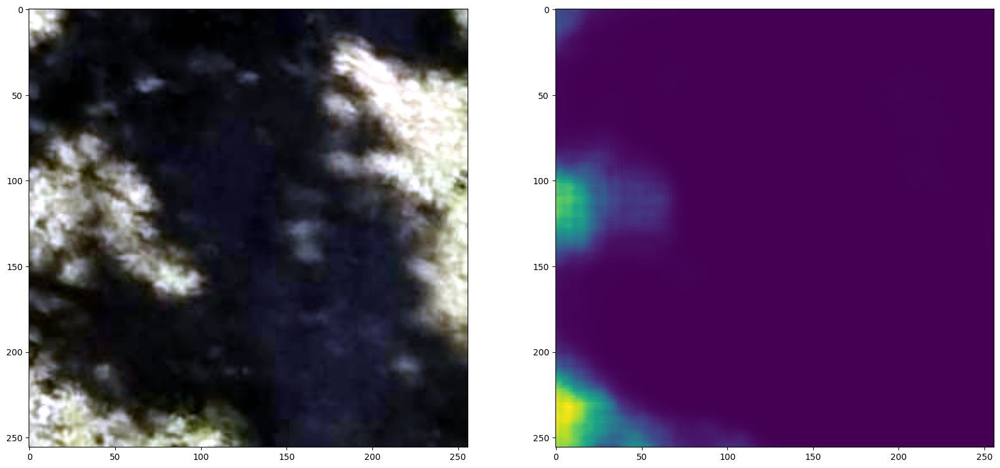

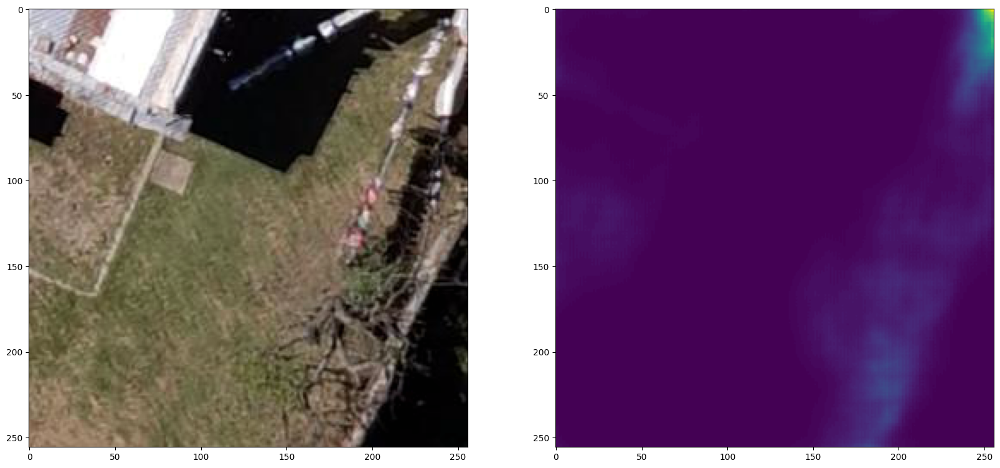

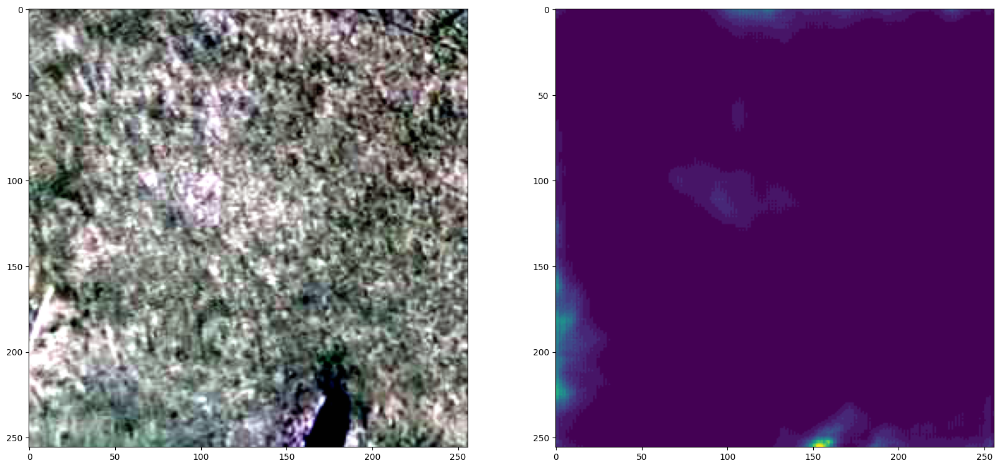

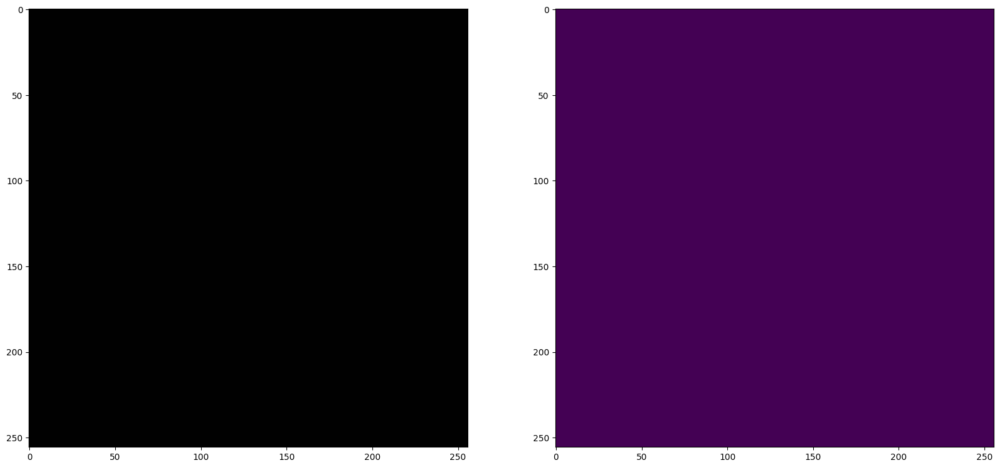

In [ ]:
plot_data_results(num_samples=4, predict_config=predict_config)


## Postprocesamiento

Por el momento hemos obtenido un montón de pequeños recortes del territorio analizado, cada uno señalando pixel por pixel la probabilidad de contener basura. Este formato resulta natural como salida de una red neuronal, que trabaja con matrices relativamente pequeñas -en este caso, imágenes de 256x256 píxeles- pero es poco útil como insumo para consumo humano.

Lo que queremos obtener es una archivo georreferenciado -un *shapefile* como se dice en la jerga de los sistemas de información geográfica- que contenga los polígonos de todas las áreas donde tenemos buenas chances de encontrar basura. Para lograr eso tenemos que realizar dos pasos adicionales:

1. En cada mosaico/chip con prediccion, conservar los píxeles que tienen altas chances de mostrar basura, e ignorar el resto
2. Unir todos esos píxeles sueltos en un sólo gran conjunto, y generar un archivo georrefernciado que contenga los polígonos que forman.

Para esto otra vez usamos funciones provistas por la librería *satproc*:

In [ ]:
from satproc.postprocess.polygonize import polygonize
from satproc.filter import filter_by_max_prob
from pathlib import Path

In [ ]:
# 1. Definimos un umbral de corte, descartando los pixeles con probabilidad menor

thresh = 0.6  # valor del umbral (o "threshold en inglés"): 60% de probabilidad o más

input_path_unfiltered= "/tmp/chips_predicciones/"
output_path_filtered = input_path_unfiltered + '/filtered_' + str(thresh).replace(".", "") + "/"


filter_by_max_prob(input_dir=input_path_unfiltered,
                   output_dir=output_path_filtered,
                   threshold=thresh)

# 2. Generamos polígonos cubriendo las áreas de los pixeles que superan el umbral

input_path = output_path_filtered
output_path = input_path_unfiltered + "/prediction/" + 'umbral_' + str(thresh).replace(".", "") + '.gpkg'

polygonize(threshold=thresh,
           input_dir=input_path,
           output=output_path)

Dissolve: 100%|##########| 647/647 [06:00<00:00,  1.79it/s]


**Filtrar resultados por superficie mínima**

Suele ser útil retirar de los resultados los polígonos muy pequeños, ya que pueden ser falsos positivos. En ocasiones, para un territorio grande analizado, pueden aparecer miles y miles de manchitas ínfimas que han sido clasificadas como basura, pero que no vale la pena revisar. Con sólo excluirlas en base a una regla de tamaño mínimo se hace muchísimo más fácil la revisión e interpretación de las predicciones del modelo.

Hay que tener en cuenta que la unidad de medida (metros, millas, grados, etc) depende del sistema de proyección de coordenadas (CRS) que use el archivo georreferenciado.

Aquí vamos a asumir que la imagen analizada utiliza la proyección habitual en datos compartidos en internet, que es WGS84. Esta proyección utiliza metros como unidad de distancia -y áreas- así que no necesitamos hacer conversiones.

Para preservar sólo póligonos que cubran al menos 5 metros cuadrados, descartando lo demás, podemos hacer esto:

In [ ]:
# Definimos el area mínima
# Atención que la unidad de medida de área depende del sistema de proyección de coordenadas (CRS) que use el archivo georreferenciado
# Aquí trabajamos con m2
min_area = 5

# el archivo con las predicciones del modelo
predictions_file = output_path

# el nombre de la capa que contiene es igual al nombre de archivo, sin la extensión
layer_name = Path(output_path).stem

# donde vamos a guardar la versión filtrada
results_file = "prediccion_basura_" + layer_name + "_area_min_" + str(min_area) + "m.gpkg"

# a filtrar
!ogr2ogr -f "GPKG" \
    -sql "SELECT * FROM $layer_name m WHERE ST_Area(geom) > $min_area" \
    -dialect SQLITE \
    -nln results \
    $results_file \
    $predictions_file

ERROR 1: PROJ: proj_create: no database context specified
ERROR 1: Cannot parse CRS http://www.opengis.net/def/crs/EPSG/0/5482
ERROR 1: PROJ: proj_create: no database context specified
ERROR 1: Cannot parse CRS http://www.opengis.net/def/crs/EPSG/0/5936
ERROR 1: PROJ: proj_create: no database context specified
ERROR 1: Cannot parse CRS http://www.opengis.net/def/crs/EPSG/0/3978
ERROR 1: PROJ: proj_create: no database context specified
ERROR 1: Cannot parse CRS http://www.opengis.net/def/crs/EPSG/0/2193


Cuando el proceso de filtrado termina, obtenemos un nuevo archivo que contiene sólo las zonas clasificadas como basura que superan la superficie mínima que definimos.

¡Aquí termina el procesamiento! Podemos llevarnos el resultado cliqueando en el ícono de carpeta de la barra izquierda de colab, y descargando el archivo que acabamos de generar:

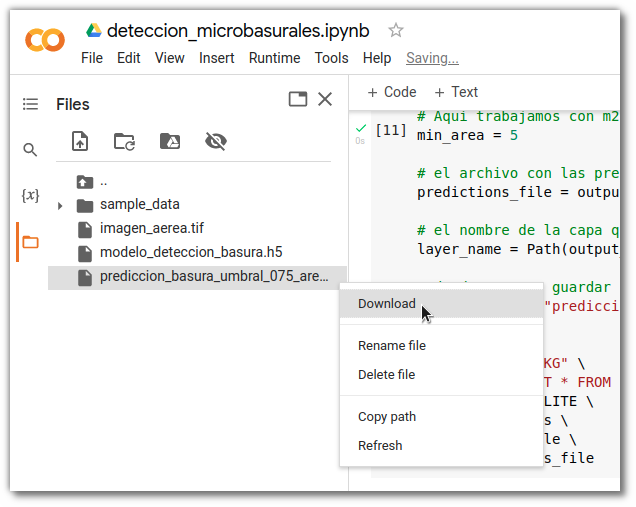

## Revisión de resultados

Ahora queda el verdadero trabajo: analizar los resultados, interpretarlos, y decidir que se puede hacer con lo aprendido. La parte que le toca a la inteligencia humana, que sigue siendo indispensable.


Podemos abrir el archivo georrefernciado que hemos producido con software GIS, como [QGIS](https://www.qgis.org), un producto de software libre gratuito y con excelente funcionalidad.



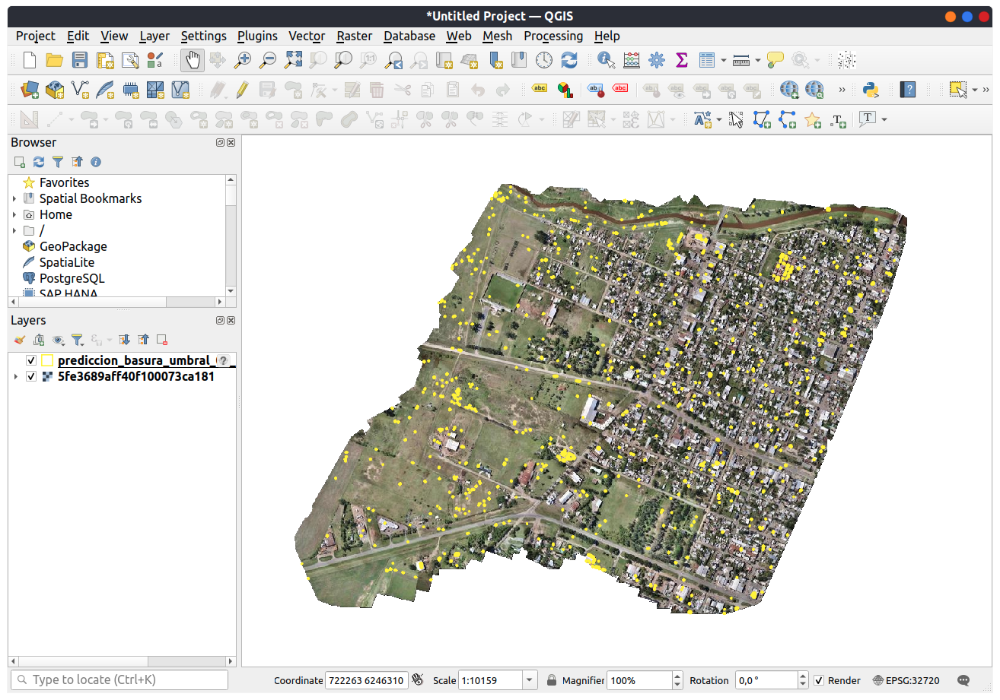

Al ver en pantalla la imagen original que hemos procesado, con la capa de predicciones proyectada por encima, podríamos llevarnos una sopresa: ¿¡hay basura en todas partes!?. Bueno, en general si. Donde hay seres humanos asentados, vamos a encontrar basura. Pero tambien es normal encontrar falsos positivos en el conjunto de predicciones.

En lo que respecta al modelo, la buena noticia es que se confirma su utilidad con abundantes aciertos, como estos:

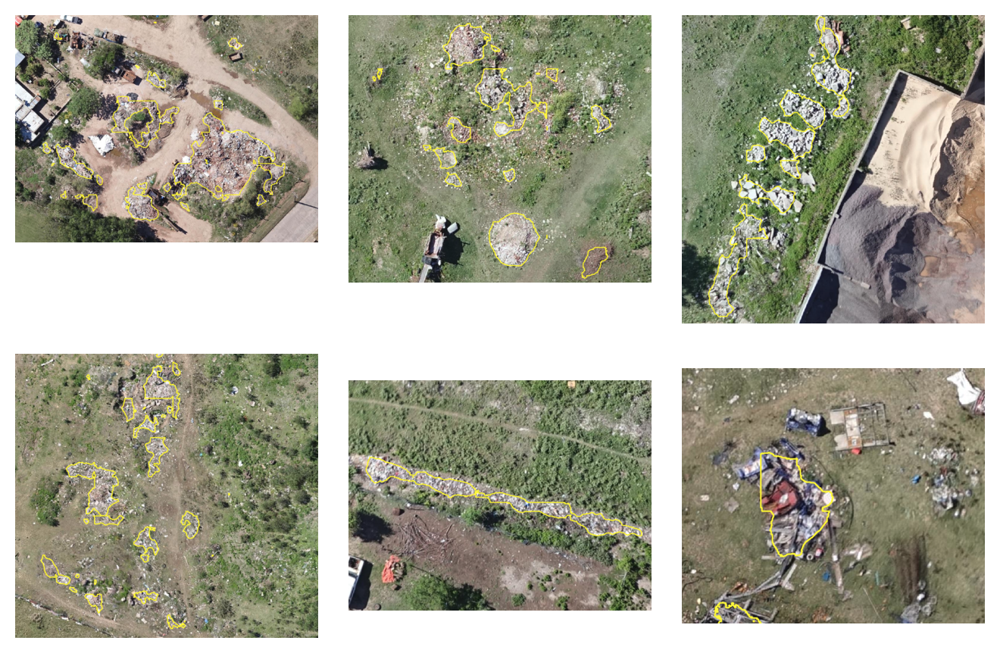

Y también aparecen errores de predicción. En general corresponden a suelo desnudo, tierra removida o parches donde ralea la vegetación (probablemente debido a que alguna textura en la imagen confunde al modelo):

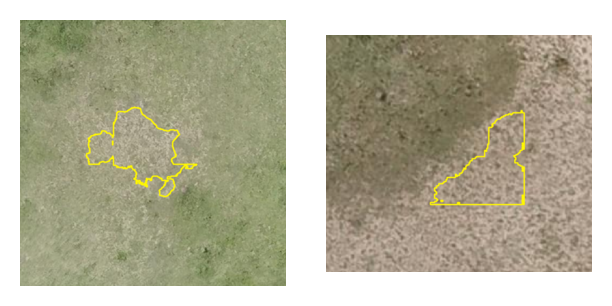

¡Y unos cuantos techos! Esto al principio es curioso, pero tiene una explicación simple: el modelo fue entrenado para reconocer pilas de ladrillos como una categoría de basural, y con imágenes de una zona urbana donde los techos de tejas son infrecuentes. Por eso donde ve rectángulos de color terracota, da la alarma:

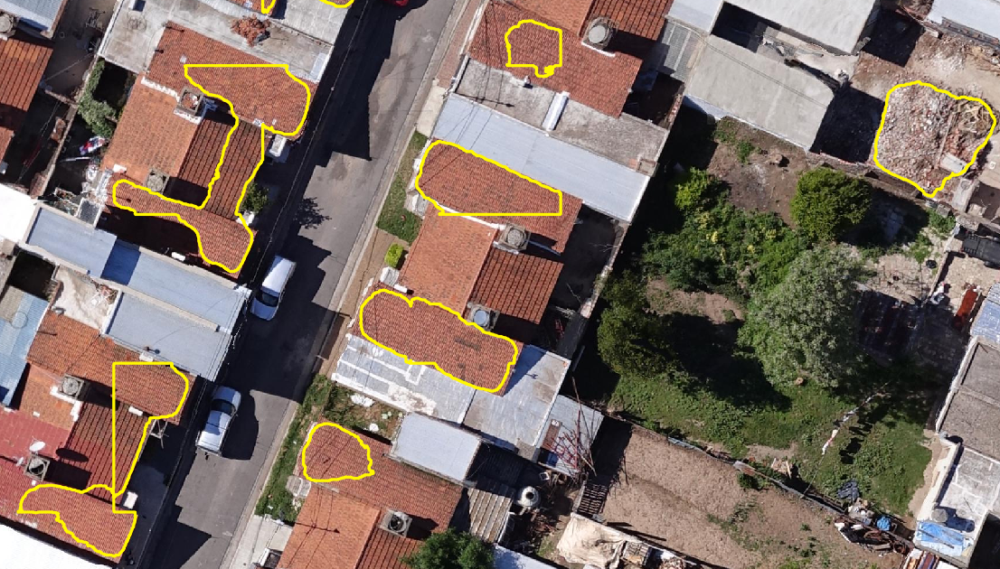

(eso si, concedámosle al modelo unos puntos por haber identificado correctamente la pila de escombros que se va a la derecha en la imagen previa).


¿Cómo podríamos mejorar el algoritmo de detección para que ignore los techos de tejas? La forma rápida sería con una operacion de GIS típica, la de aplicar una "máscara" de recorte sobre los resultados, retirando las áreas que corresponden a lotes edificados. La forma más lenta, sería aprovechar los resultados que obtuvimos, y con una inspección visual que puede realizarse bastante rápido marcar como "correctos" o "incorrectos" los resultados, para volver a entrenar al modelo con estos inputs adicionales. Con eso suele bastar para obtener una vaersión que no cae en esos errores evidentes.

Esto último nos sirve para recordar que -como es de esperarse- el *machine learning* produce mejores resultados cuando se produce con datos específicos del contexto de aplicación, mas allá de la gran ventaja de poder utilizar un modelo ya entrenado cuando no se dispone de datos locales.

Por eso hemos compartido de forma pública el código y documentación para realizar el ciclo de vida completo de detección de basurales utilizando IA, incluyendo la etapa de entrenamiento, y así generar modelos específicos para cualquier región. El material se encuentra disponible en https://github.com/dymaxionlabs/basurales